For my dataset, I am using the Default of Ames, Iowa Housing Dataset located here: https://www.kaggle.com/prevek18/ames-housing-dataset  

***Problem statement:*** Purchasing a home is one of the most important decisions a person can make. By extension, selling a home is also a life-changing decision. Overpaying for a home or undervaluing your home are two critical mistakes that a person can make.

***Proposal:*** This Project will examine which features of a home are the most important in determining the price of a house in Ames, Iowa. The features will then be used a to build a predictive model that will accurately estimate the price of the house. This is a supervised learning regression problem. 

## Load libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from pycaret.regression import *
from sklearn import __version__ as skv


from notebook import __version__ as nbv

# scipy Libraries
from scipy import stats
from scipy import __version__ as scipv

# matplotlib Libraries
import matplotlib.pyplot as plt
from matplotlib import __version__ as mpv


import warnings
warnings.filterwarnings('ignore')

#Display all the columns of the dataframe
pd.pandas.set_option('display.max_columns',None)
plt.style.use('fivethirtyeight')

from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

# Library Versions
print('Library Versions\n' + '='*16 + 
      '\nscipy = %s' % scipv)
print('pandas = %s' % pd.__version__)
print('numpy = %s' % np.__version__)
print('sklearn = %s' % skv)
print('seaborn = %s' % sns.__version__)
print('matplotlib = %s' % mpv)
print('Jupyter Notebook (notebook) = %s' % nbv)

Library Versions
scipy = 1.6.2
pandas = 1.3.2
numpy = 1.19.5
sklearn = 0.23.2
seaborn = 0.11.2
matplotlib = 3.4.2
Jupyter Notebook (notebook) = 6.4.3


## Load the Dataset  

In [2]:
# Read the data 
ames_housing = pd.read_csv('AmesHousing.csv')

## print shape of dataset with rows and columns
print("Data shape: " + str(ames_housing.shape))

Data shape: (2930, 82)


In [3]:
ames_housing.columns

Index(['Order', 'PID', 'MS SubClass', 'MS Zoning', 'Lot Frontage', 'Lot Area',
       'Street', 'Alley', 'Lot Shape', 'Land Contour', 'Utilities',
       'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
       'Condition 2', 'Bldg Type', 'House Style', 'Overall Qual',
       'Overall Cond', 'Year Built', 'Year Remod/Add', 'Roof Style',
       'Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type',
       'Mas Vnr Area', 'Exter Qual', 'Exter Cond', 'Foundation', 'Bsmt Qual',
       'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin SF 1',
       'BsmtFin Type 2', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF',
       'Heating', 'Heating QC', 'Central Air', 'Electrical', '1st Flr SF',
       '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bsmt Full Bath',
       'Bsmt Half Bath', 'Full Bath', 'Half Bath', 'Bedroom AbvGr',
       'Kitchen AbvGr', 'Kitchen Qual', 'TotRms AbvGrd', 'Functional',
       'Fireplaces', 'Fireplace Qu', 'Garage Type', 'Garage Yr Blt',
      

In [4]:
# We can see that the column names have spaces. We will remove these spaces.
ames_housing.columns = ames_housing.columns.str.replace(' ', '')

From the variable descriptions, we see that the Order and PID variables are unique identifiers, and are not useful for modeling. We will drop these columns and examine the data dictionary.

In [5]:
# Drop multiple columns by name
ames_housing.drop(['Order', 'PID'], axis=1, inplace=True)

***Data dictionary***

Here is the attribute information for the 82 variables:

SalePrice - the property's sale price in dollars. This is the target variable that we are trying to predict.
    
Order (Discrete): Observation number (Unique).

PID (Nominal): Parcel identification number  - can be used with city web site for parcel review (Unique). 

MS SubClass (Nominal): Identifies the type of dwelling involved in the sale.	

       020	1-STORY 1946 & NEWER ALL STYLES
       030	1-STORY 1945 & OLDER
       040	1-STORY W/FINISHED ATTIC ALL AGES
       045	1-1/2 STORY - UNFINISHED ALL AGES
       050	1-1/2 STORY FINISHED ALL AGES
       060	2-STORY 1946 & NEWER
       070	2-STORY 1945 & OLDER
       075	2-1/2 STORY ALL AGES
       080	SPLIT OR MULTI-LEVEL
       085	SPLIT FOYER
       090	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MS Zoning (Nominal): Identifies the general zoning classification of the sale.
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM	Residential Medium Density
	
Lot Frontage (Continuous): Linear feet of street connected to property

Lot Area (Continuous): Lot size in square feet

Street (Nominal): Type of road access to property

       Grvl	Gravel	
       Pave	Paved
       	
Alley (Nominal): Type of alley access to property

       Grvl	Gravel
       Pave	Paved
       NA 	No alley access
		
Lot Shape (Ordinal): General shape of property

       Reg	Regular	
       IR1	Slightly irregular
       IR2	Moderately Irregular
       IR3	Irregular
       
Land Contour (Nominal): Flatness of the property

       Lvl	Near Flat/Level	
       Bnk	Banked - Quick and significant rise from street grade to building
       HLS	Hillside - Significant slope from side to side
       Low	Depression
		
Utilities (Ordinal): Type of utilities available
		
       AllPub	All public Utilities (E,G,W,& S)	
       NoSewr	Electricity, Gas, and Water (Septic Tank)
       NoSeWa	Electricity and Gas Only
       ELO	Electricity only	
	
Lot Config (Nominal): Lot configuration

       Inside	Inside lot
       Corner	Corner lot
       CulDSac	Cul-de-sac
       FR2	Frontage on 2 sides of property
       FR3	Frontage on 3 sides of property
	
Land Slope (Ordinal): Slope of property
		
       Gtl	Gentle slope
       Mod	Moderate Slope	
       Sev	Severe Slope
	
Neighborhood (Nominal): Physical locations within Ames city limits (map available)

       Blmngtn	Bloomington Heights
       Blueste	Bluestem
       BrDale	Briardale
       BrkSide	Brookside
       ClearCr	Clear Creek
       CollgCr	College Creek
       Crawfor	Crawford
       Edwards	Edwards
       Gilbert	Gilbert
       Greens	Greens
       GrnHill	Green Hills
       IDOTRR	Iowa DOT and Rail Road
       Landmrk	Landmark
       MeadowV	Meadow Village
       Mitchel	Mitchell
       Names	North Ames
       NoRidge	Northridge
       NPkVill	Northpark Villa
       NridgHt	Northridge Heights
       NWAmes	Northwest Ames
       OldTown	Old Town
       SWISU	South & West of Iowa State University
       Sawyer	Sawyer
       SawyerW	Sawyer West
       Somerst	Somerset
       StoneBr	Stone Brook
       Timber	Timberland
       Veenker	Veenker
			
Condition 1 (Nominal): Proximity to various conditions
	
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
Condition 2 (Nominal): Proximity to various conditions (if more than one is present)
		
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
Bldg Type (Nominal): Type of dwelling
		
       1Fam	Single-family Detached	
       2FmCon	Two-family Conversion; originally built as one-family dwelling
       Duplx	Duplex
       TwnhsE	Townhouse End Unit
       TwnhsI	Townhouse Inside Unit
	
House Style (Nominal): Style of dwelling
	
       1Story	One story
       1.5Fin	One and one-half story: 2nd level finished
       1.5Unf	One and one-half story: 2nd level unfinished
       2Story	Two story
       2.5Fin	Two and one-half story: 2nd level finished
       2.5Unf	Two and one-half story: 2nd level unfinished
       SFoyer	Split Foyer
       SLvl	Split Level
	
Overall Qual (Ordinal): Rates the overall material and finish of the house

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average
       5	Average
       4	Below Average
       3	Fair
       2	Poor
       1	Very Poor
	
Overall Cond (Ordinal): Rates the overall condition of the house

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average	
       5	Average
       4	Below Average	
       3	Fair
       2	Poor
       1	Very Poor
		
Year Built (Discrete): Original construction date

Year Remod/Add (Discrete): Remodel date (same as construction date if no remodeling or additions)

Roof Style (Nominal): Type of roof

       Flat	Flat
       Gable	Gable
       Gambrel	Gabrel (Barn)
       Hip	Hip
       Mansard	Mansard
       Shed	Shed
		
Roof Matl (Nominal): Roof material

       ClyTile	Clay or Tile
       CompShg	Standard (Composite) Shingle
       Membran	Membrane
       Metal	Metal
       Roll	Roll
       Tar&Grv	Gravel & Tar
       WdShake	Wood Shakes
       WdShngl	Wood Shingles
		
Exterior 1 (Nominal): Exterior covering on house

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast	
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
Exterior 2 (Nominal): Exterior covering on house (if more than one material)

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
Mas Vnr Type (Nominal): Masonry veneer type

       BrkCmn	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       None	None
       Stone	Stone
	
Mas Vnr Area (Continuous): Masonry veneer area in square feet

Exter Qual (Ordinal): Evaluates the quality of the material on the exterior 
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
Exter Cond (Ordinal): Evaluates the present condition of the material on the exterior
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
Foundation (Nominal): Type of foundation
		
       BrkTil	Brick & Tile
       CBlock	Cinder Block
       PConc	Poured Contrete	
       Slab	Slab
       Stone	Stone
       Wood	Wood
		
Bsmt Qual (Ordinal): Evaluates the height of the basement

       Ex	Excellent (100+ inches)	
       Gd	Good (90-99 inches)
       TA	Typical (80-89 inches)
       Fa	Fair (70-79 inches)
       Po	Poor (<70 inches
       NA	No Basement
		
Bsmt Cond (Ordinal): Evaluates the general condition of the basement

       Ex	Excellent
       Gd	Good
       TA	Typical - slight dampness allowed
       Fa	Fair - dampness or some cracking or settling
       Po	Poor - Severe cracking, settling, or wetness
       NA	No Basement
	
Bsmt Exposure	(Ordinal): Refers to walkout or garden level walls

       Gd	Good Exposure
       Av	Average Exposure (split levels or foyers typically score average or above)	
       Mn	Mimimum Exposure
       No	No Exposure
       NA	No Basement
	
BsmtFin Type 1	(Ordinal): Rating of basement finished area

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement
		
BsmtFin SF 1 (Continuous): Type 1 finished square feet

BsmtFinType 2	(Ordinal): Rating of basement finished area (if multiple types)

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

BsmtFin SF 2 (Continuous): Type 2 finished square feet

Bsmt Unf SF (Continuous): Unfinished square feet of basement area

Total Bsmt SF (Continuous): Total square feet of basement area

Heating	(Nominal): Type of heating
		
       Floor	Floor Furnace
       GasA	Gas forced warm air furnace
       GasW	Gas hot water or steam heat
       Grav	Gravity furnace	
       OthW	Hot water or steam heat other than gas
       Wall	Wall furnace
		
HeatingQC (Ordinal): Heating quality and condition

       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
Central Air (Nominal): Central air conditioning

       N	No
       Y	Yes
		
Electrical (Ordinal): Electrical system

       SBrkr	Standard Circuit Breakers & Romex
       FuseA	Fuse Box over 60 AMP and all Romex wiring (Average)	
       FuseF	60 AMP Fuse Box and mostly Romex wiring (Fair)
       FuseP	60 AMP Fuse Box and mostly knob & tube wiring (poor)
       Mix	Mixed
		
1st Flr SF (Continuous): First Floor square feet
 
2nd Flr SF (Continuous)	: Second floor square feet

Low Qual Fin SF (Continuous): Low quality finished square feet (all floors)

Gr Liv Area (Continuous): Above grade (ground) living area square feet

Bsmt Full Bath (Discrete): Basement full bathrooms

Bsmt Half Bath (Discrete): Basement half bathrooms

Full Bath (Discrete): Full bathrooms above grade

Half Bath (Discrete): Half baths above grade

Bedroom (Discrete): Bedrooms above grade (does NOT include basement bedrooms)

Kitchen (Discrete): Kitchens above grade

KitchenQual (Ordinal): Kitchen quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       	
TotRmsAbvGrd	(Discrete): Total rooms above grade (does not include bathrooms)

Functional (Ordinal): Home functionality (Assume typical unless deductions are warranted)

       Typ	Typical Functionality
       Min1	Minor Deductions 1
       Min2	Minor Deductions 2
       Mod	Moderate Deductions
       Maj1	Major Deductions 1
       Maj2	Major Deductions 2
       Sev	Severely Damaged
       Sal	Salvage only
		
Fireplaces (Discrete): Number of fireplaces

FireplaceQu (Ordinal): Fireplace quality

       Ex	Excellent - Exceptional Masonry Fireplace
       Gd	Good - Masonry Fireplace in main level
       TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
       Fa	Fair - Prefabricated Fireplace in basement
       Po	Poor - Ben Franklin Stove
       NA	No Fireplace
		
Garage Type (Nominal): Garage location
		
       2Types	More than one type of garage
       Attchd	Attached to home
       Basment	Basement Garage
       BuiltIn	Built-In (Garage part of house - typically has room above garage)
       CarPort	Car Port
       Detchd	Detached from home
       NA	No Garage
		
Garage Yr Blt (Discrete): Year garage was built
		
Garage Finish (Ordinal)	: Interior finish of the garage

       Fin	Finished
       RFn	Rough Finished	
       Unf	Unfinished
       NA	No Garage
		
Garage Cars (Discrete): Size of garage in car capacity

Garage Area (Continuous): Size of garage in square feet

Garage Qual (Ordinal): Garage quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
Garage Cond (Ordinal): Garage condition

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
Paved Drive (Ordinal): Paved driveway

       Y	Paved 
       P	Partial Pavement
       N	Dirt/Gravel
		
Wood Deck SF (Continuous): Wood deck area in square feet

Open Porch SF (Continuous): Open porch area in square feet

Enclosed Porch (Continuous): Enclosed porch area in square feet

3-Ssn Porch (Continuous): Three season porch area in square feet

Screen Porch (Continuous): Screen porch area in square feet

Pool Area (Continuous): Pool area in square feet

Pool QC (Ordinal): Pool quality
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       NA	No Pool
		
Fence (Ordinal): Fence quality
		
       GdPrv	Good Privacy
       MnPrv	Minimum Privacy
       GdWo	Good Wood
       MnWw	Minimum Wood/Wire
       NA	No Fence
	
Misc Feature (Nominal): Miscellaneous feature not covered in other categories
		
       Elev	Elevator
       Gar2	2nd Garage (if not described in garage section)
       Othr	Other
       Shed	Shed (over 100 SF)
       TenC	Tennis Court
       NA	None
		
Misc Val (Continuous): $Value of miscellaneous feature

Mo Sold (Discrete): Month Sold (MM)

Yr Sold (Discrete): Year Sold (YYYY)

Sale Type (Nominal): Type of sale
		
       WD 	Warranty Deed - Conventional
       CWD	Warranty Deed - Cash
       VWD	Warranty Deed - VA Loan
       New	Home just constructed and sold
       COD	Court Officer Deed/Estate
       Con	Contract 15% Down payment regular terms
       ConLw	Contract Low Down payment and low interest
       ConLI	Contract Low Interest
       ConLD	Contract Low Down
       Oth	Other
		
Sale Condition (Nominal): Condition of sale

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)
		

Next, we split the dataset into X and y, where X contains the independent variables, and y is the target variable.

In [6]:
X, y = ames_housing.iloc[:, :-1], ames_housing.iloc[:, -1]
print("Shape of X: " +str(X.shape), "Shape of y: " +str(y.shape))

Shape of X: (2930, 79) Shape of y: (2930,)


Now, we will split the data into training and testing sets. We will preserve the percentages of the YrSold variable in both the train and test sets by stratifying the data on the YrSold variable. The reason for this is to ensure that all YrSold values occur in both the train and test sets in similar percentages.  

In [7]:
# First check the percentage of occurrences of YrSold in the full dataset
ames_housing.YrSold.value_counts(normalize=True)

2007    0.236860
2009    0.221160
2006    0.213311
2008    0.212287
2010    0.116382
Name: YrSold, dtype: float64

## Split data into train and test sets.

In [8]:
X_train, X_test, y_train, y_test = train_test_split(
    ames_housing,ames_housing['SalePrice'], test_size=0.5, random_state=123, stratify=ames_housing.YrSold)

In [9]:
# Next, check the percentage of occurrences of YrSold in X_train and X_test
print('X_train YrSold percentages:')
print('')
print(X_train.YrSold.value_counts(normalize=True))
print('')
print('X_test YrSold percentages:')
X_test.YrSold.value_counts(normalize=True)

X_train YrSold percentages:

2007    0.236860
2009    0.221160
2006    0.212969
2008    0.212287
2010    0.116724
Name: YrSold, dtype: float64

X_test YrSold percentages:


2007    0.236860
2009    0.221160
2006    0.213652
2008    0.212287
2010    0.116041
Name: YrSold, dtype: float64

From abvove, we can see that we have similar percentages of the YrSold variable in both the train and test set. Now, let's check the shape of X_train and X_test.

In [10]:
print("Shape of X_train: " +str(X_train.shape), "Shape of X_test: " +str(X_test.shape))

Shape of X_train: (1465, 80) Shape of X_test: (1465, 80)


In [11]:
# Check the train info
print(X_train.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1465 entries, 2079 to 2703
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1465 non-null   int64  
 1   MSZoning       1465 non-null   object 
 2   LotFrontage    1225 non-null   float64
 3   LotArea        1465 non-null   int64  
 4   Street         1465 non-null   object 
 5   Alley          85 non-null     object 
 6   LotShape       1465 non-null   object 
 7   LandContour    1465 non-null   object 
 8   Utilities      1465 non-null   object 
 9   LotConfig      1465 non-null   object 
 10  LandSlope      1465 non-null   object 
 11  Neighborhood   1465 non-null   object 
 12  Condition1     1465 non-null   object 
 13  Condition2     1465 non-null   object 
 14  BldgType       1465 non-null   object 
 15  HouseStyle     1465 non-null   object 
 16  OverallQual    1465 non-null   int64  
 17  OverallCond    1465 non-null   int64  
 18  YearB

## Exploratory Data Analysis

We will be performing all the below steps as part of our EDA

1. Checking for missing values
2. Plotting distributions to find patterns in the data
3. Categorical variables: remove rare labels
4. Scaling the data, so that all the variables are normalised

We will use the data dictionary to split the variables into lists to identify the target, nominal, ordinal, continuous, and discrete variables.

In [12]:
target_var = ['SalePrice']

nominal_var = ['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LandContour', 
'LotConfig', 'RoofMatl', 'Condition1', 'Condition2', 'BldgType', 
'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 
'Foundation', 'Heating', 'CentralAir', 'GarageType','MiscFeature',
'SaleType', 'SaleCondition']

ordinal_var = ['Neighborhood','LotShape', 'Utilities', 'LandSlope', 'OverallQual',
'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'Electrical',
'KitchenQual', 'Functional', 'FireplaceQu', 'GarageFinish', 'GarageQual',
'GarageCond', 'PavedDrive', 'PoolQC', 'Fence']

# Combine nominal and ordinal variables
categorical_var = nominal_var + ordinal_var

continuous_var = ['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1',
'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
'LowQualFinSF', 'GrLivArea', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal']

discrete_var = ['YearBuilt', 'YearRemod/Add','BsmtFullBath', 'BsmtHalfBath',
                'FullBath', 'HalfBath', 'BedroomAbvGr','KitchenAbvGr', 'TotRmsAbvGrd',
                'Fireplaces', 'GarageYrBlt', 'GarageCars','MoSold', 'YrSold']

# Combine continuous and discrete variables
numerical_var = continuous_var + discrete_var

### Correlations between numerical variables

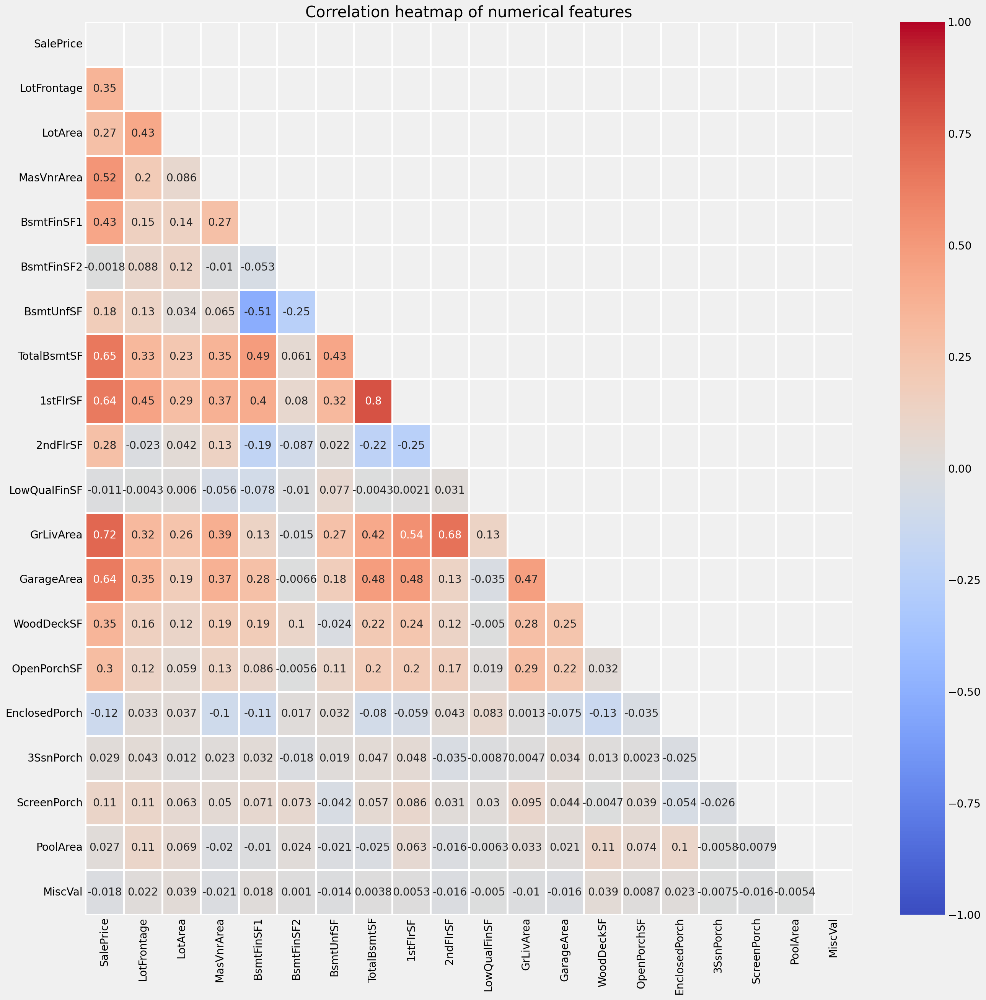

In [13]:
mask = np.zeros_like(X_train[target_var+continuous_var].corr())
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(20,20))
sns.heatmap(X_train[target_var+continuous_var].corr(),
            cmap='coolwarm',
            annot=True,
            mask=mask,
            linewidths=2.5,
            vmin=-1,
            vmax=1,
                
)
plt.title('Correlation heatmap of numerical features', fontsize=20);

From above, we can see that there are moderately high correlations between SalePrice and the variables that have to do with square footage (GrLivArea, GarageArea, 1stFlrSF, and TotalBsmtSF). This makes sense that larger houses would have higher prices. 

### Univariate plots of continuous variables

Next we will create a function to plot histograms, normal plots, and boxplots of the continuous variables. We will also include the target variable in these plots, along with an  

In [14]:
# Create a function to plot the histogram, Q=Q plot and boxplot

def diagnostic_plots(df, variable):
    '''This function takes a df and variable as input,
    and plots a histogram, Q=Q plot and boxplot
    with a red horizontal line showing outliers.'''
    
    # Calculate the outliers as mean + 4 times standard deviation
    outliers = df[variable].mean() + 4*(df[variable].std())

    # define figure size
    plt.figure(figsize=(17, 5))

    # histogram
    plt.subplot(1, 3, 1)
    sns.distplot(df[variable])
    plt.title('Histogram of ' +variable,fontsize=16)

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.title('Probability plot of ' +variable,fontsize=16)
    plt.ylabel('Quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot of ' +variable,fontsize=16)
    plt.axhline(y = outliers, color = 'y', linestyle = '-', label='Outlier line')
    plt.legend()
    plt.tight_layout()
    plt.show()    

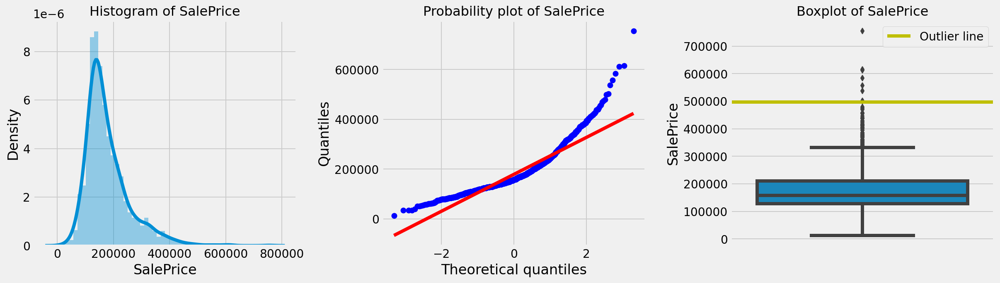

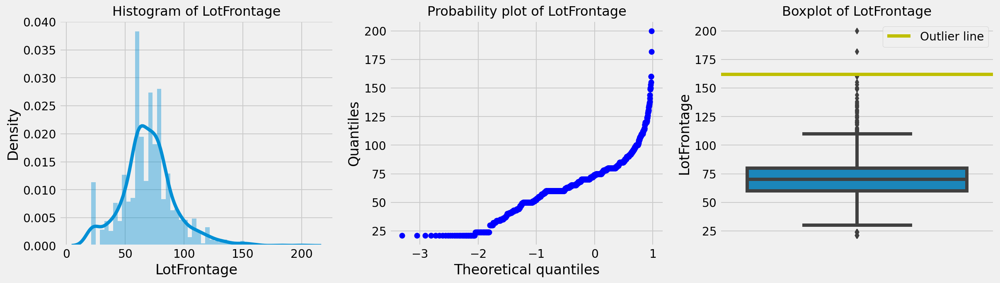

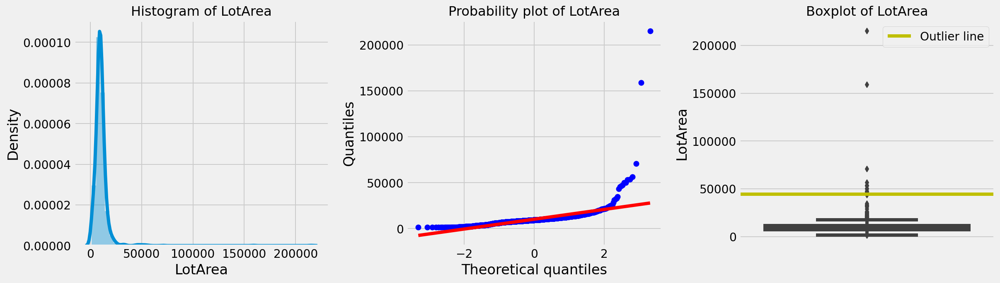

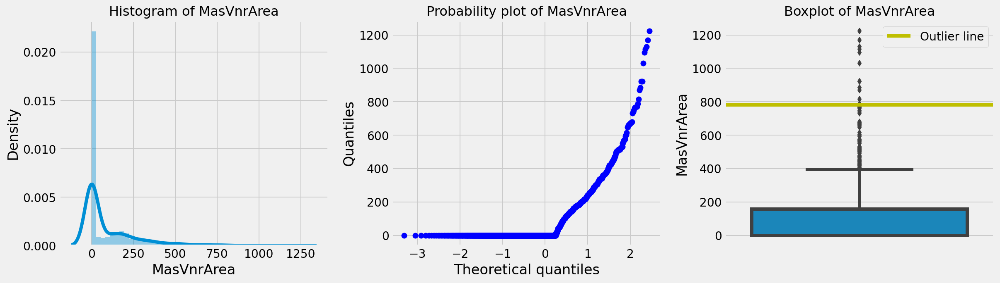

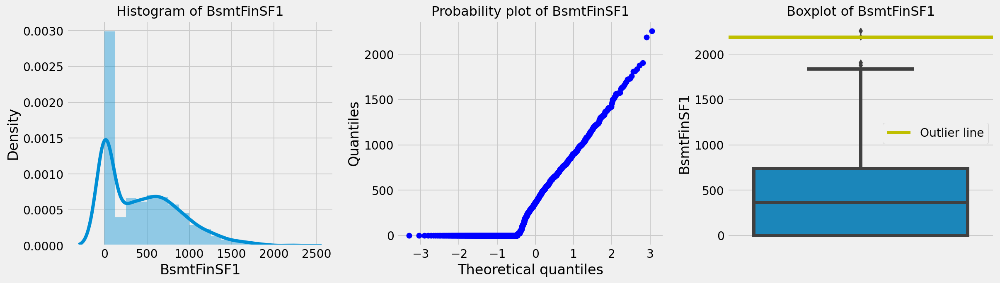

...

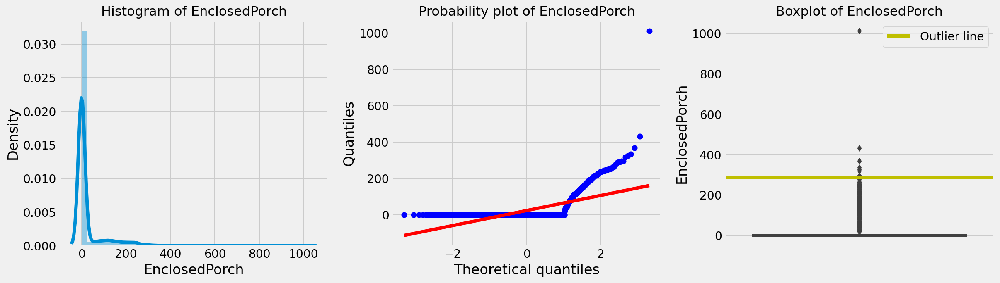

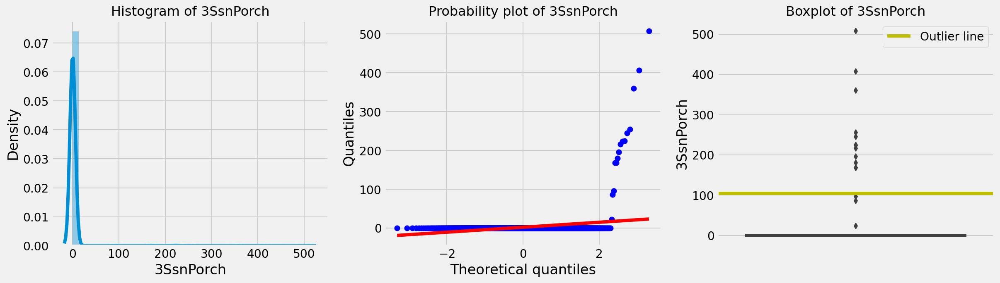

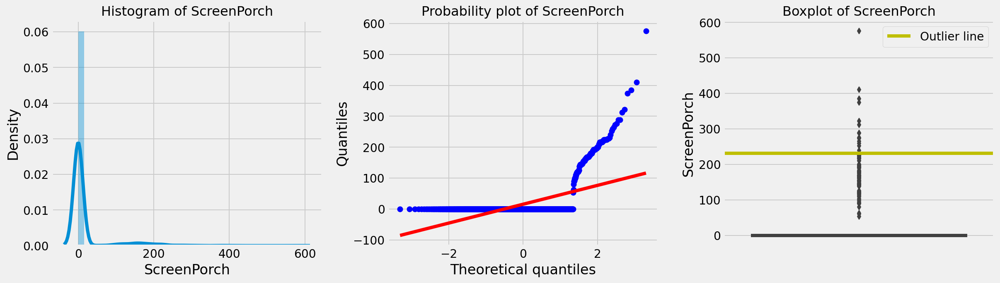

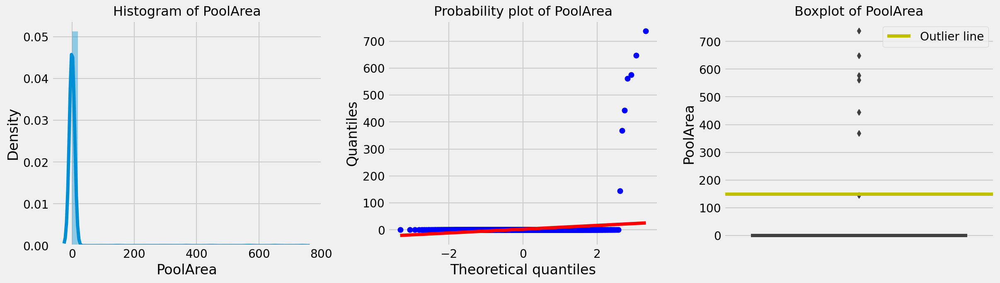

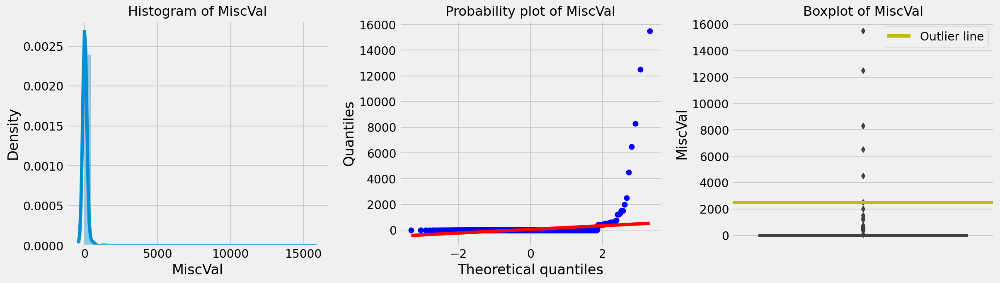

In [15]:
# Plot the plot the histogram, Q=Q plot and boxplot for each numerical variable
for col in (target_var + continuous_var):
    diagnostic_plots(X_train,col)
    plt.show();

From the above plots of the SalePrice, we can see that it is right-skewed. From the boxplot of SalePrice, we can see that there are several points above the outliers line, which equals the mean + four standard deviations.  

In [16]:
# Calculate the saleprice outlier value
sale_price_outlier = X_train['SalePrice'].mean() + 4*(X_train['SalePrice'].std())
# Display outliers in a dataframe
X_train[X_train['SalePrice']>sale_price_outlier]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemod/Add,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
366,20,RL,63.0,17423,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2008,2009,Hip,CompShg,VinylSd,VinylSd,Stone,748.0,Ex,TA,PConc,Ex,TA,No,GLQ,1904.0,Unf,0.0,312.0,2216.0,GasA,Ex,Y,SBrkr,2234,0,0,2234,1.0,0.0,2,0,1,1,Ex,9,Typ,1,Gd,Attchd,2009.0,Fin,3.0,1166.0,TA,TA,Y,0,60,0,0,0,0,NaN,NaN,NaN,0,7,2009,New,Partial,501837
2332,60,RL,85.0,16056,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,StoneBr,Norm,Norm,1Fam,2Story,9,5,2005,2006,Hip,CompShg,CemntBd,CmentBd,Stone,208.0,Gd,TA,PConc,Ex,TA,Av,GLQ,240.0,Unf,0.0,1752.0,1992.0,GasA,Ex,Y,SBrkr,1992,876,0,2868,0.0,0.0,3,1,4,1,Ex,11,Typ,1,Gd,BuiltIn,2005.0,Fin,3.0,716.0,TA,TA,Y,214,108,0,0,0,0,NaN,NaN,NaN,0,7,2006,New,Partial,556581
44,20,RL,100.0,12919,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,9,5,2009,2010,Hip,CompShg,VinylSd,VinylSd,Stone,760.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,2188.0,Unf,0.0,142.0,2330.0,GasA,Ex,Y,SBrkr,2364,0,0,2364,1.0,0.0,2,1,2,1,Ex,11,Typ,2,Gd,Attchd,2009.0,Fin,3.0,820.0,TA,TA,Y,0,67,0,0,0,0,NaN,NaN,NaN,0,3,2010,New,Partial,611657
1063,20,RL,106.0,12720,Pave,NaN,Reg,HLS,AllPub,Inside,Mod,NridgHt,Norm,Norm,1Fam,1Story,10,5,2003,2003,Hip,CompShg,MetalSd,MetalSd,Stone,680.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,2257.0,Unf,0.0,278.0,2535.0,GasA,Ex,Y,SBrkr,2470,0,0,2470,2.0,0.0,1,1,1,1,Ex,7,Typ,2,Gd,Attchd,2003.0,Fin,3.0,789.0,TA,TA,Y,154,65,0,0,216,144,Ex,NaN,NaN,0,2,2008,WD,Normal,615000
46,20,RL,110.0,14300,Pave,NaN,Reg,HLS,AllPub,Inside,Mod,NridgHt,Norm,Norm,1Fam,1Story,9,5,2003,2004,Hip,CompShg,VinylSd,VinylSd,BrkFace,1095.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,1373.0,Unf,0.0,1473.0,2846.0,GasA,Ex,Y,SBrkr,2696,0,0,2696,1.0,0.0,2,1,3,1,Ex,10,Typ,2,Gd,Attchd,2003.0,Fin,3.0,958.0,TA,TA,Y,220,150,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal,500000
15,60,RL,47.0,53504,Pave,NaN,IR2,HLS,AllPub,CulDSac,Mod,StoneBr,Norm,Norm,1Fam,2Story,8,5,2003,2003,Hip,CompShg,CemntBd,Wd Shng,BrkFace,603.0,Ex,TA,PConc,Gd,TA,Gd,ALQ,1416.0,Unf,0.0,234.0,1650.0,GasA,Ex,Y,SBrkr,1690,1589,0,3279,1.0,0.0,3,1,4,1,Ex,12,Mod,1,Gd,BuiltIn,2003.0,Fin,3.0,841.0,TA,TA,Y,503,36,0,0,210,0,NaN,NaN,NaN,0,6,2010,WD,Normal,538000
1767,60,RL,104.0,21535,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,10,6,1994,1995,Gable,WdShngl,HdBoard,HdBoard,BrkFace,1170.0,Ex,TA,PConc,Ex,TA,Gd,GLQ,1455.0,Unf,0.0,989.0,2444.0,GasA,Ex,Y,SBrkr,2444,1872,0,4316,0.0,1.0,3,1,4,1,Ex,10,Typ,2,Ex,Attchd,1994.0,Fin,3.0,832.0,TA,TA,Y,382,50,0,0,0,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000
2450,60,RL,114.0,17242,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NoRidge,Norm,Norm,1Fam,2Story,9,5,1993,1994,Hip,CompShg,MetalSd,MetalSd,BrkFace,738.0,Gd,Gd,PConc,Ex,TA,Gd,Rec,292.0,GLQ,1393.0,48.0,1733.0,GasA,Ex,Y,SBrkr,1933,1567,0,3500,1.0,0.0,3,1,4,1,Ex,11,Typ,1,TA,Attchd,1993.0,RFn,3.0,959.0,TA,TA,Y,870,86,0,0,210,0,NaN,NaN,NaN,0,5,2006,WD,Normal,584500


We can see that there are 8 records that are outliers in the SalePrice. We will investigate the SaleCondition variable by plotting the counts and mean Sale Price for the SaleCondition categories. Since we will be plotting these for other variables, we will create a function to create the plots.

### Bar and count plots of categorical variables

In [17]:
def plot_count_and_bar(df,variable):
    '''This function takes a df and variable as input,
    and plots a countplot of the variable and barplot
    of the mean SalePrice vs. the variable.'''
    
    fig, ax = plt.subplots(1,2)
    
    # Countplot
    df.groupby(variable)['SalePrice'].agg(['mean']).plot.bar(ax=ax[0],
                                                             figsize=(11,4),
                                                              ylabel='SalePrice',
                                                            title='Mean Sale Price vs. ' + variable)
    
    # Barplot
    df.groupby(variable)['SalePrice'].agg(['count']).plot.bar(ax=ax[1],
                                                             ylabel='Count',
                                                             title='Count of ' + variable)
    plt.tight_layout()
    plt.show();

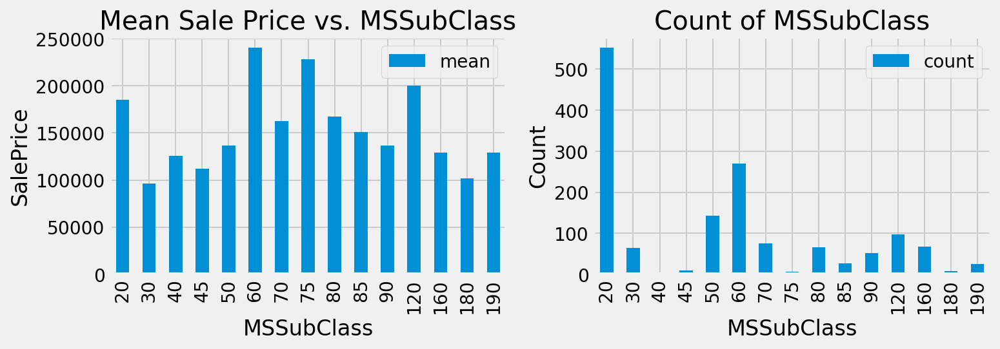

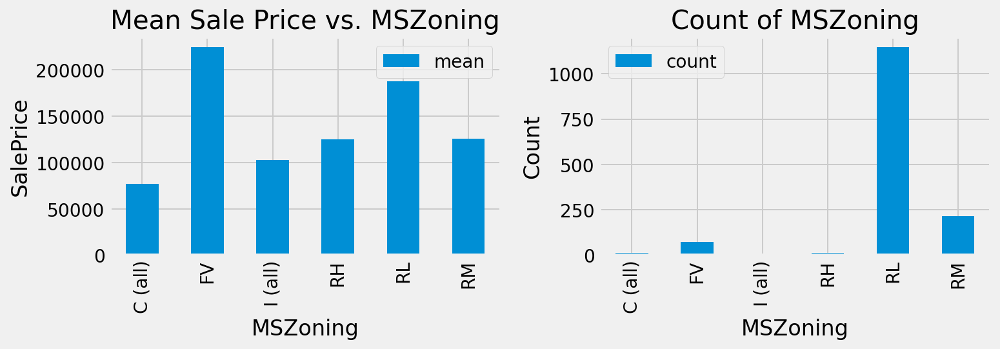

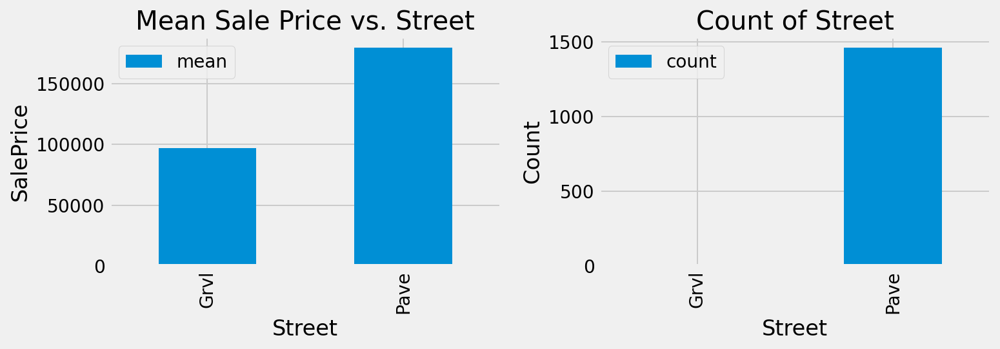

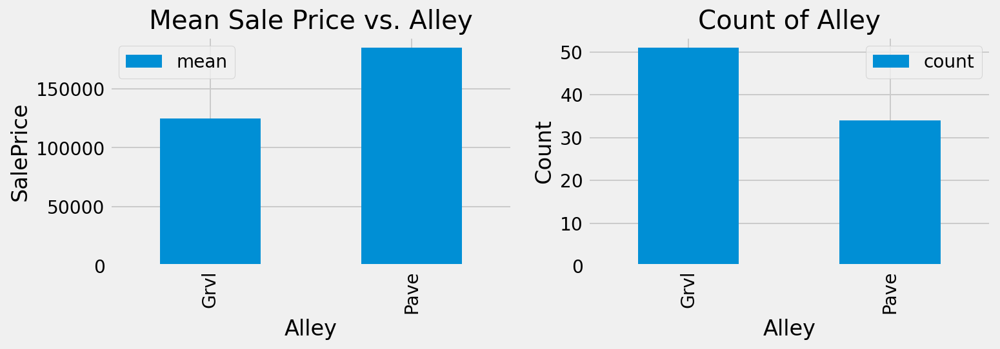

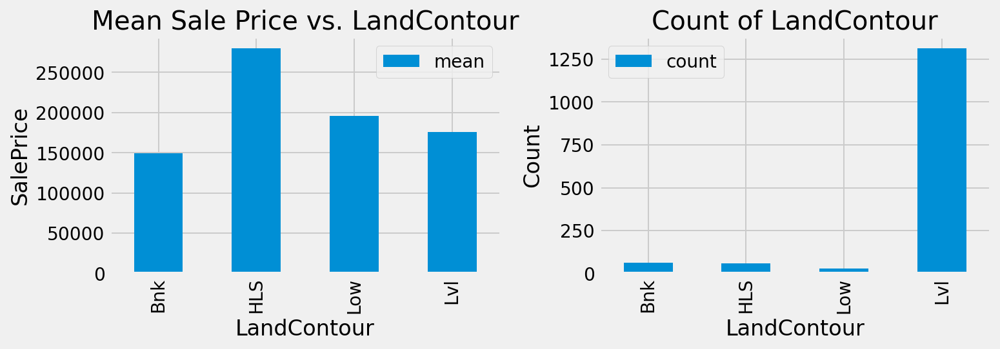

...

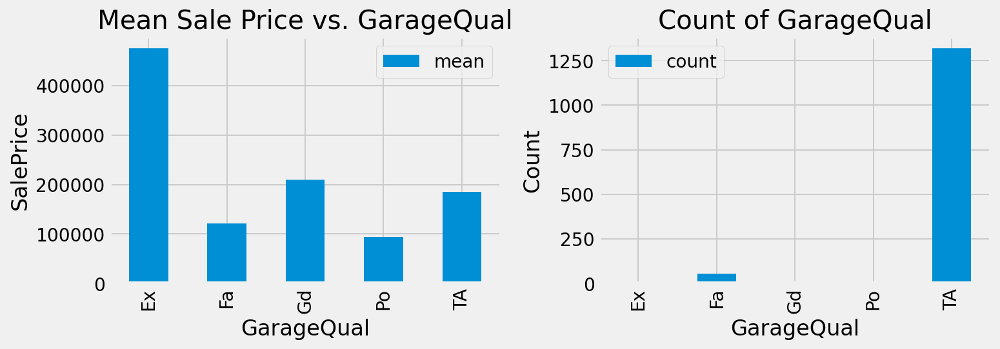

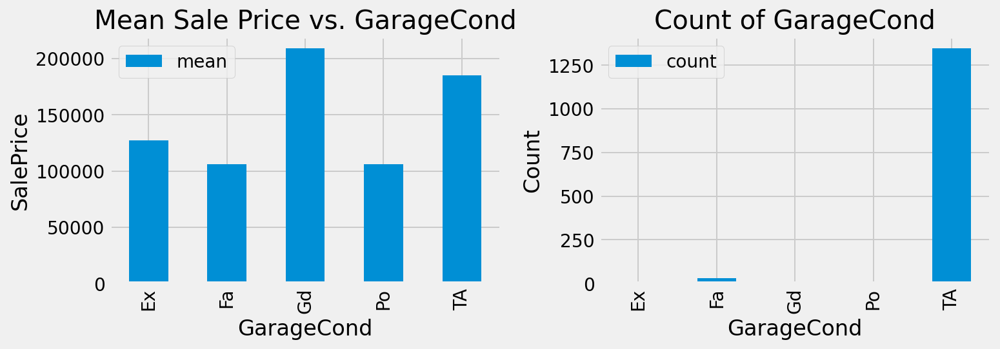

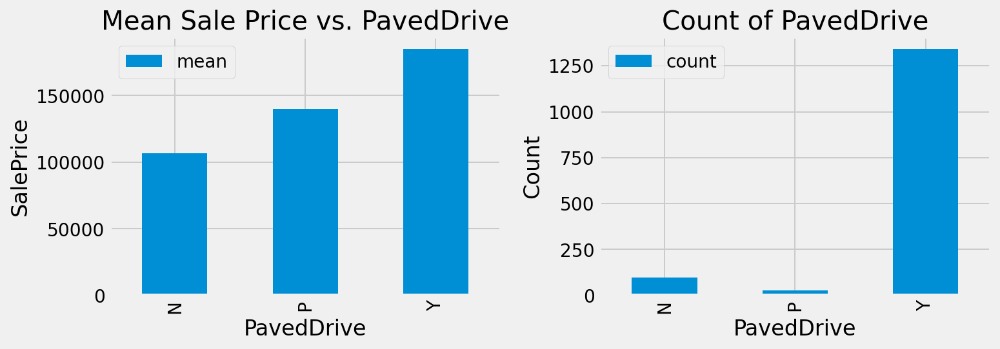

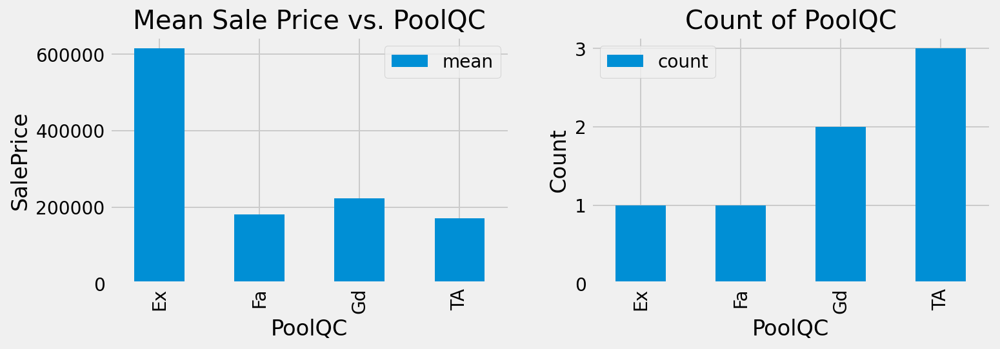

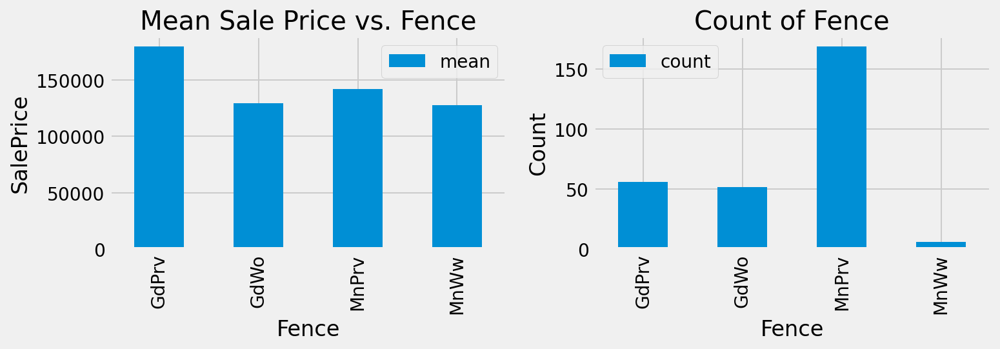

In [18]:
# Plot a barplot and countplot of each categorical variable vs. Mean SalePrice
for col in (categorical_var):
    plot_count_and_bar(X_train,col)

### Bivariate plots of continuous variables vs. target variable.  
Now we will look at the scatterplot with a seaborn regplot that shows a linear regression model fit for SalePrice vs. each numerical feature. 

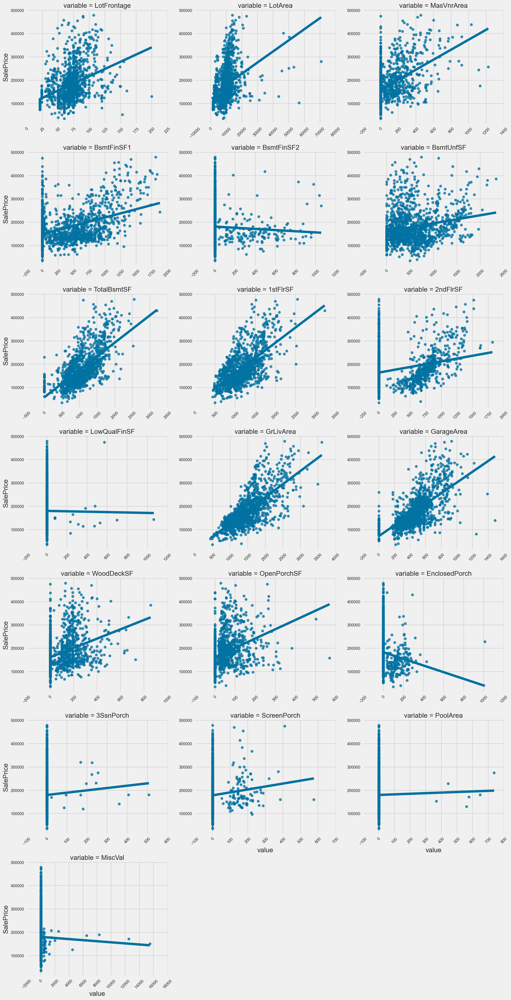

In [65]:
# Creating regression plots for SalePrice vs numerical variables
plt.style.use('fivethirtyeight')
con = pd.melt(X_train, id_vars='SalePrice', value_vars=continuous_var)

g = sns.FacetGrid(con, col='variable', col_wrap=3, sharex=False, sharey=False, height=5, aspect=1.2)

g = g.map(sns.regplot, 'value', 'SalePrice', color='b', ci=None)

g.set_xticklabels(rotation=45)
g.tight_layout()

### Removing outliers in SalePrice and SaleCondition variables ###  
From above, we can see that 'Abnorml' has a much lower mean SalePrice compared to most other categories. Additionally 'Family' has very few occurrences. We will remove these categories from both the X_train and X_test dataframes. We will also drop the 8 SalePrice outliers we previously identified. We will also drop the SalePrice outliers in X_test. These values were calculated from the X_train data so there is no data leakage. Looking at the data dictionary for the Sale Condition, we can also see a 'Family' category that indicates the property was sold to a family member. We will delete these records since we are trying to predict house prices for regular sales

In [20]:
# Filter the outliers by X_train index
indexNames = X_train[X_train['SalePrice']>sale_price_outlier].index

# Drop the indexes where SalePrice > mean + 4*std
X_train.drop(indexNames , inplace=True)
y_train.drop(indexNames , inplace=True)

# Filter the outliers by X_test index
indexNames = X_test[X_test['SalePrice']>sale_price_outlier].index

# Drop the indexes where SalePrice > mean + 4*std
X_test.drop(indexNames , inplace=True)
y_test.drop(indexNames , inplace=True)

# Filter the outliers by X_train index
indexNames = X_train[(X_train['SaleCondition']=='Abnorml')|
                     (X_train['SaleCondition']=='Family')].index

# Drop the indexes in X_train
X_train.drop(indexNames , inplace=True)
y_train.drop(indexNames , inplace=True)

# Filter the outliers by X_train index
indexNames = X_test[(X_test['SaleCondition']=='Abnorml')|
                     (X_test['SaleCondition']=='Family')].index

# Drop the indexes in X_test
X_test.drop(indexNames , inplace=True)
y_test.drop(indexNames , inplace=True)

In [21]:
len(X_test)+len(X_train),len(ames_housing)


(2678, 2930)

### Removing outliers in GrLivArea, LotFrontage, and LotArea ### 

From the above scatterplots, we can see that GrLivArea has a strong linear relationship with SalePrice, but there is one extreme outlier that is almost 1,000 square feet bigger than any other house. We can also see an extreme outlier in LotFrontage and LotArea. We will remove the outliers 'GrLivArea' > 4000, 'LotFrontage' > 250, and LotArea > 100000 in X_train and also in X_test.

In [22]:
# Filter the outliers by X_train index
indexNames = X_train[(X_train['GrLivArea']>4000)|
                    (X_train['LotFrontage']>250)|
                    (X_train['LotArea']>100000)].index

# Drop the indexes in X_train
X_train.drop(indexNames , inplace=True)
y_train.drop(indexNames , inplace=True)

# Filter the outliers by X_test index
indexNames = X_test[(X_test['GrLivArea']>4000)|
                    (X_test['LotFrontage']>250)|
                    (X_test['LotArea']>100000)].index

# Drop the indexes in X_test
X_test.drop(indexNames , inplace=True)
y_test.drop(indexNames , inplace=True)

## Examining missing values in categorical variables

Now we will check the percentage of nan values present in each categorical variable. We do this by identifying variables with missing values, and plotting the percentage of missing values for each variable. We will drop variables with a large percentage of missing values (>70%). We will include a red cutoff line at 70% to identify which variables which variables to drop.

16 Columns with missing values: ['Electrical', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtFinType1', 'BsmtFinType2', 'BsmtExposure', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'FireplaceQu', 'Fence', 'Alley', 'MiscFeature', 'PoolQC']


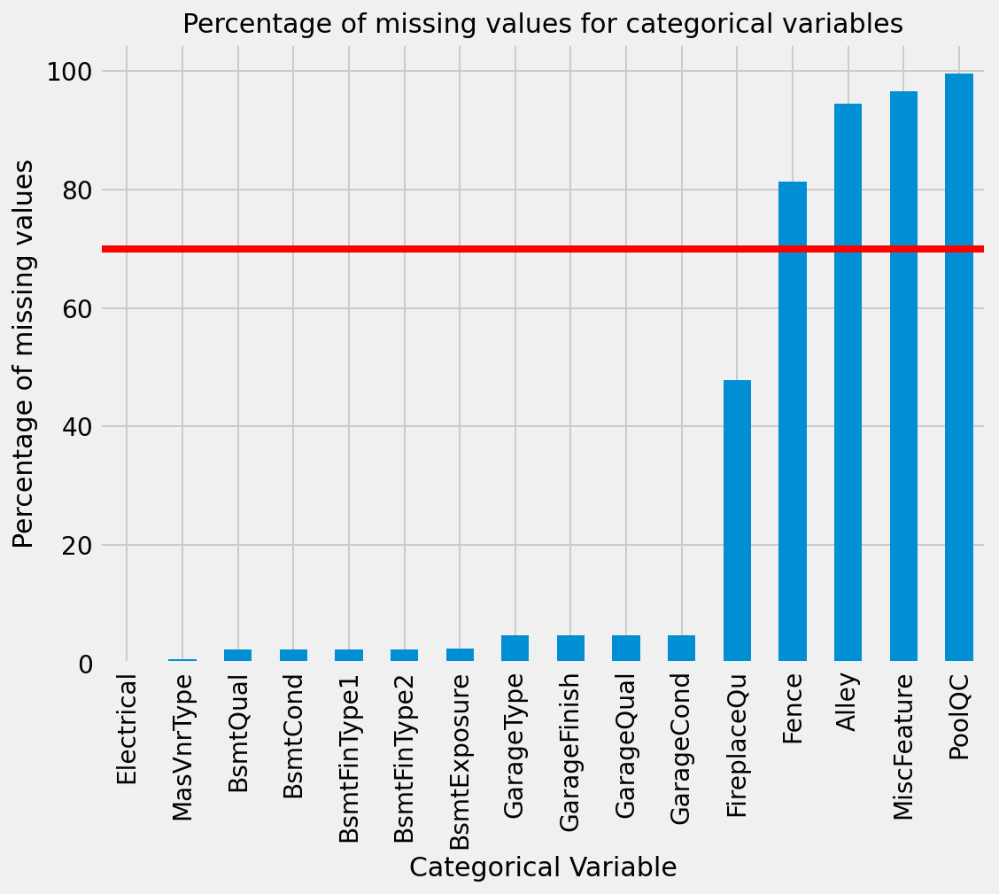

In [23]:
# Create a pandas series of variables with missing values
missing = X_train[categorical_var].isnull().sum()
missing = (missing[missing > 0]/len(X_train))*100
missing.sort_values(inplace=True)
plt.figure(figsize=(8,6))
missing.plot.bar()
plt.axhline(y = 70, color = 'r', linestyle = '-')
plt.xlabel('Categorical Variable', fontsize=15)
plt.ylabel('Percentage of missing values', fontsize=15)
plt.title('Percentage of missing values for categorical variables', fontsize=15)
print("{} Columns with missing values: {}".format(len(missing.index),list(missing.index)));

### Dropping variables with a high percentage of missing values

From above we can see that there are four variables missing greater than 70% of their values. These variables will have little predictive power and so we will remove them. We will create a list of these variables and drop them from both X_train and X_test.

In [24]:
variables_to_drop = list(missing[missing.values>70].index)
print("Variables to drop: {}".format(variables_to_drop))

# Drop the columns from both X_train and X_test
X_train.drop(labels = variables_to_drop, axis = 1, inplace = True)
X_test.drop(labels = variables_to_drop, axis = 1, inplace= True)

# We need to update the list of categorical variables

nominal_var = list(set(nominal_var) - set(variables_to_drop))
ordinal_var = list(set(ordinal_var) - set(variables_to_drop))

# Combine nominal and ordinal variables
categorical_var = nominal_var + ordinal_var

Variables to drop: ['Fence', 'Alley', 'MiscFeature', 'PoolQC']


### Handling missing values in categorical variables

#### FireplaceQu categorical variable

From the missing values plot above, we can see that four garage-related variables have the same percentage of missing values and five basement-related variables have the same percentage of missing values. We will now examine these variables and also the FireplaceQu variable, since it has a large number of missing values(~50%). Looking at the data dictionary, the FireplaceQu has six levels: Ex (Excellent), Gd (Good), TA (Average), Fa (Fair), Po (Poor), and NA (No Fireplace. We will examine the unique values for FireplaceQu.

In [25]:
X_train['FireplaceQu'].unique()

array([nan, 'TA', 'Gd', 'Po', 'Ex', 'Fa'], dtype=object)

We can see that there is no NA level in the FireplaceQu variable, but instead there is a nan level. This appears to be mislabeleing of levels, as nan is interpreted differently than the string 'NA'. We will check this assumption by first checking for null values in FireplaceQu across all data. Then we will check for null values in FireplaceQu when there are no fireplaces (Fireplaces = 0). 

In [26]:
# Check the nan values in FireplaceQu across all Fireplace counts
print(X_train[['FireplaceQu']].isnull().sum())

# Check number of nans in FireplaceQu when there are no fireplaces
X_train[X_train['Fireplaces']==0][['FireplaceQu']].isnull().sum()

FireplaceQu    639
dtype: int64


FireplaceQu    639
dtype: int64

##### Replace nan values with 'NA'

We can see that all nan values for FireplaceQu occur when Fireplaces = 0. This means the data was mislabeled and so we will replace nan values with 'NA' in both X_train and X_test.

In [27]:
# Replace nan with 'NA'
X_train['FireplaceQu'] = X_train['FireplaceQu'].replace(np.nan, 'NA')
X_test['FireplaceQu'] = X_test['FireplaceQu'].replace(np.nan, 'NA')
X_train['FireplaceQu'].unique()

array(['NA', 'TA', 'Gd', 'Po', 'Ex', 'Fa'], dtype=object)

#### Garage-related categorical variables

As with the FireplaceQu variable, we believe the Garage variables might also be mislabeld as nan instead of 'NA'. To check this, we will first identify the levels of the garage variables. 

In [28]:
# Create a variable of garage categorical columns
garage_cat_cols = ['GarageType','GarageQual',
                   'GarageCond','GarageFinish']

# Check the unique levels of each variable
for col in garage_cat_cols:
    print(col + ' levels:', X_train[col].unique())

GarageType levels: ['Attchd' 'Detchd' 'BuiltIn' '2Types' nan 'Basment' 'CarPort']
GarageQual levels: ['TA' nan 'Fa' 'Gd' 'Po' 'Ex']
GarageCond levels: ['TA' nan 'Fa' 'Po' 'Gd' 'Ex']
GarageFinish levels: ['Unf' 'RFn' 'Fin' nan]


Looking at the data dictionary for these variables, there should be a 'NA' level, but we can only see nan levels. This again suggests a mislabeling. We will check this assumption by first checking for null values in the garage categorical columns across all data. Then we will check for null values in garage categorical columnswhen there are no garages (GarageArea = 0). 

In [29]:
# Check the nan values in the garage categorical columns across all garage counts
print(X_train[garage_cat_cols].isnull().sum())

# Check number of nans in FireplaceQu when there are no fireplaces
X_train[X_train['GarageArea']==0][garage_cat_cols].isnull().sum()

GarageType      64
GarageQual      64
GarageCond      64
GarageFinish    64
dtype: int64


GarageType      64
GarageQual      64
GarageCond      64
GarageFinish    64
dtype: int64

##### Replace nan values with 'NA'

We can see that almost all nan values for the garage categorical variables occur when GarageArea = 0. This means the data was mislabeled and so we will replace nan values with 'NA' in both X_train and X_test. 

In [30]:
# Replace nan with 'NA'
X_train[garage_cat_cols] = X_train[garage_cat_cols].replace(np.nan, 'NA')
X_test[garage_cat_cols] = X_test[garage_cat_cols].replace(np.nan, 'NA')

# Re-Check the unique levels of each variable
for col in garage_cat_cols:
    print(col + ' new levels:', X_train[col].unique())

GarageType new levels: ['Attchd' 'Detchd' 'BuiltIn' '2Types' 'NA' 'Basment' 'CarPort']
GarageQual new levels: ['TA' 'NA' 'Fa' 'Gd' 'Po' 'Ex']
GarageCond new levels: ['TA' 'NA' 'Fa' 'Po' 'Gd' 'Ex']
GarageFinish new levels: ['Unf' 'RFn' 'Fin' 'NA']


#### Basement-related categorical variables

As with the garage-related categorical variable, we believe the basement-related categorical variables might also be mislabeld as nan instead of 'NA'. To check this, we will first identify the levels of the basement variables. 

In [31]:
# Create a variable of basement categorical columns
basement_cat_cols = ['BsmtQual','BsmtFinType1',
                     'BsmtCond','BsmtFinType2','BsmtExposure' ]

# Check the unique levels of each variable
for col in basement_cat_cols:
    print(col + ' levels:', X_train[col].unique())

BsmtQual levels: ['TA' nan 'Gd' 'Ex' 'Fa' 'Po']
BsmtFinType1 levels: ['BLQ' nan 'Unf' 'GLQ' 'LwQ' 'ALQ' 'Rec']
BsmtCond levels: ['TA' nan 'Gd' 'Fa' 'Po' 'Ex']
BsmtFinType2 levels: ['Unf' nan 'GLQ' 'Rec' 'LwQ' 'BLQ' 'ALQ']
BsmtExposure levels: ['No' nan 'Av' 'Gd' 'Mn']


Looking at the data dictionary for these variables, there should be a 'NA' level, but we can only see nan levels. This again suggests a mislabeling. We will check this assumption by first checking for null values in the basement categorical columns across all data. Then we will check for null values in basement categorical columnswhen there is no basement (TotalBsmtSF = 0).

In [32]:
# Check the nan values in the garage categorical columns across all garage counts
print(X_train[basement_cat_cols].isnull().sum())

# Check number of nans in FireplaceQu when there are no fireplaces
X_train[X_train['TotalBsmtSF']==0][basement_cat_cols].isnull().sum()

BsmtQual        33
BsmtFinType1    33
BsmtCond        33
BsmtFinType2    33
BsmtExposure    35
dtype: int64


BsmtQual        33
BsmtFinType1    33
BsmtCond        33
BsmtFinType2    33
BsmtExposure    33
dtype: int64

##### Replace nan values with 'NA'

We can see that almost all nan values for the basement categorical variables occur when TotalBsmtSF = 0. This means the data was mislabeled and so we will replace nan values with 'NA' in both X_train and X_test. 

In [33]:
# Replace nan with 'NA'
X_train[basement_cat_cols] = X_train[basement_cat_cols].replace(np.nan, 'NA')
X_test[basement_cat_cols] = X_test[basement_cat_cols].replace(np.nan, 'NA')

# Re-Check the unique levels of each variable
for col in basement_cat_cols:
    print(col + ' new levels:', X_train[col].unique())

BsmtQual new levels: ['TA' 'NA' 'Gd' 'Ex' 'Fa' 'Po']
BsmtFinType1 new levels: ['BLQ' 'NA' 'Unf' 'GLQ' 'LwQ' 'ALQ' 'Rec']
BsmtCond new levels: ['TA' 'NA' 'Gd' 'Fa' 'Po' 'Ex']
BsmtFinType2 new levels: ['Unf' 'NA' 'GLQ' 'Rec' 'LwQ' 'BLQ' 'ALQ']
BsmtExposure new levels: ['No' 'NA' 'Av' 'Gd' 'Mn']


#### Imputing remaining categorical variables

Since there is a very small percentage of missing values in the remaining Electrical and MasVnrType variables, we will impute these variables using the most frequent occurrence of the variable. To avoid data leakage, we will define a function to impute the values from X_train to transform X_test.

In [34]:
# Import Simple Imputer and from SkLearn
from sklearn.impute import SimpleImputer

# Prepare the Imputation strategies
mode_impute = SimpleImputer(strategy = 'most_frequent')
mean_impute = SimpleImputer(strategy = 'mean')

def apply_imputation(imputation_strategy, column):
    '''Function that applies the imputation to the desired column.
    Returns the values for train and test.'''

    # Fit the data to the training data only. Transform both train and test data.
    imputed_train = imputation_strategy.fit_transform(X = X_train[[column]])
    imputed_test = imputation_strategy.transform(X = X_test[[column]])
    
    return imputed_train, imputed_test

##### Replace nan values with mode for Electrical and MasVnrType variables

In [35]:
for column in ['Electrical','MasVnrType']:
    X_train[column] = apply_imputation(mode_impute, column)[0]
    X_test[column] = apply_imputation(mode_impute, column)[1]

In [36]:
# Verify there are no more missing values
X_train[categorical_var].isna().sum().sum()

0

## Examining missing values in continuous variables  

Now we will check the percentage of nan values present in each continuous variable. As before, we do this by identifying variables with missing values, and plotting the percentage of missing values for each variable. 

3 Columns with missing values: ['MasVnrArea', 'GarageYrBlt', 'LotFrontage']


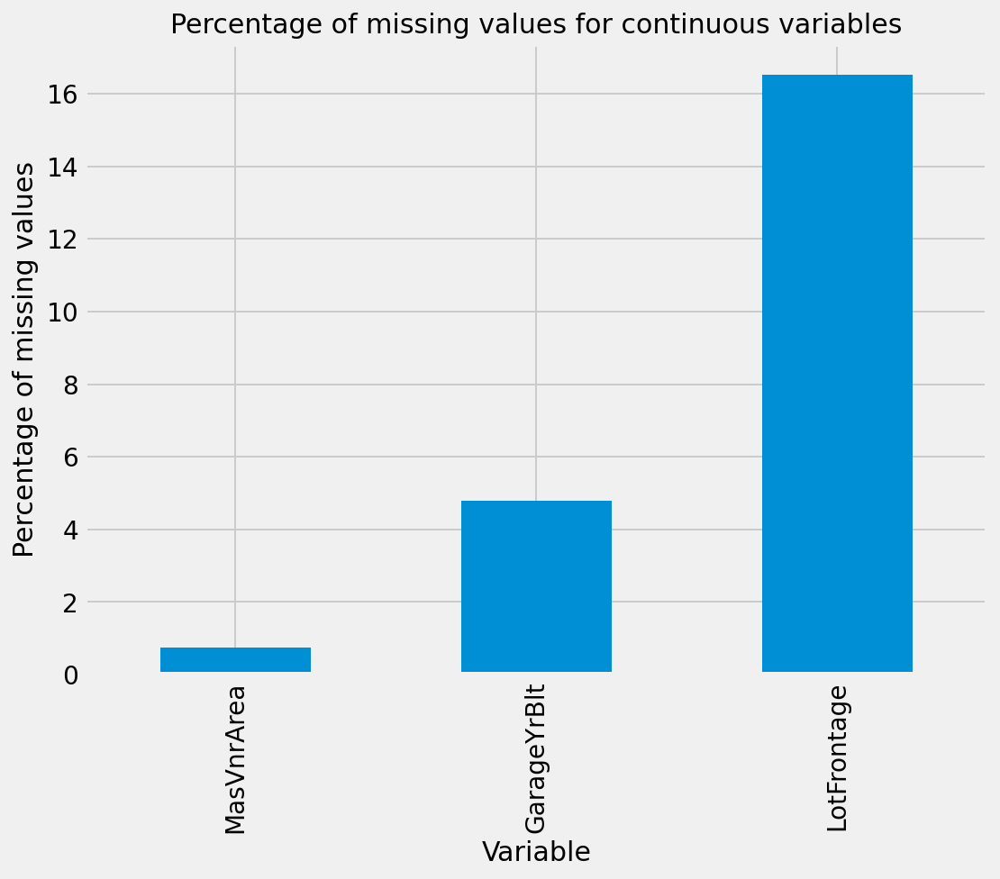

In [37]:
# Create a pandas series of variables with missing values
missing = X_train[numerical_var].isnull().sum()
missing = (missing[missing > 0]/len(X_train))*100
missing.sort_values(inplace=True)
plt.figure(figsize=(8,6))
missing.plot.bar()
plt.xlabel('Variable', fontsize=15)
plt.ylabel('Percentage of missing values', fontsize=15)
plt.title('Percentage of missing values for continuous variables', fontsize=15)
print("{} Columns with missing values: {}".format(len(missing.index),list(missing.index)));

### Handling missing values in continuous variables

#### LotFrontage continuous variable

We will impute the missing values of LotFrontage by first calculating the average LotFrontage for each LotShape. We will then use the average LotFrontage for each LotShape to impute the missing values of the LotFrontage for each LotShape. First we groupby Lotshape to get the average LotFrontage for each LotShape.

In [38]:
grouped = X_train.groupby('LotShape')['LotFrontage'].agg(['mean'])
grouped.reset_index(inplace=True)
grouped.rename(columns={'mean':'LotFrontage_mean'},inplace=True)
grouped

,LotShape,LotFrontage_mean
0,IR1,74.683333
1,IR2,68.565217
2,IR3,81.500000
3,Reg,67.462611


Next we create a dictionary to store the average LotFrontage values for each LotShape.

In [39]:
# Create a dictionary of LotShape: LotFrontage_mean key value pairs
dict_ordinal ={k:v for k,v in zip(grouped['LotShape'],grouped['LotFrontage_mean'])}
dict_ordinal

{'IR1': 74.68333333333334,
 'IR2': 68.56521739130434,
 'IR3': 81.5,
 'Reg': 67.46261089987325}

##### Impute LotFrontage values using average LotFrontage for each LotShape

Finally, we impute the missing LotFrontage values using the average LotFrontage value for each LotShape in X_train.

In [40]:
for k,v in dict_ordinal.items():
    X_train.loc[(X_train['LotShape']==k)&
                (X_train['LotFrontage'].isnull()),
                'LotFrontage'] = v
    X_test.loc[(X_test['LotShape']==k)&
                (X_test['LotFrontage'].isnull()),
                'LotFrontage'] = v

#### GarageYrBlt continuous variable

We saw before that the Garage variables were mislabeld as nan instead of 'NA'. This happened when there was no Garage (i.e. GarageArea = 0). We will check to see if the GarageYrBlt has nans when there is no garage.

In [41]:
# Check the nan values in the garage categorical columns across all garage counts
print(X_train['GarageYrBlt'].isnull().sum())

# Check number of nans in FireplaceQu when there are no fireplaces
X_train[X_train['GarageArea']==0]['GarageYrBlt'].isnull().sum()

64


64

We can see that nearly all of the GarageYrBlt nans happen when there is no garage. We will therefore replace the nans with 0.

##### Replace nan values with 0

In [42]:
# Replace nan with 0
X_train['GarageYrBlt'] = X_train['GarageYrBlt'].replace(np.nan, 0)
X_test['GarageYrBlt'] = X_test['GarageYrBlt'].replace(np.nan, 0)

#### Imputing remaining continuous variables

The remaining columns have very few missing values, so we will impute these values using the mode.

In [43]:
for column in ['GarageArea', 'BsmtFullBath', 'BsmtHalfBath',
               'GarageCars', 'MasVnrArea','BsmtFinSF1',
              'BsmtFinSF2','BsmtUnfSF','BsmtUnfSF','TotalBsmtSF']:
    X_train[column] = apply_imputation(mode_impute, column)[0]
    X_test[column] = apply_imputation(mode_impute, column)[1]

We are finished with handling nan values. Before we move on to encoding categorical variables, we will double-check there are no missing numerical values.

In [44]:
# Verify there are no more missing values
X_train[numerical_var].isna().sum().sum()

0

### Combining rare levels of categorical variables

Categorical variables with many levels can lead to poor model performance, as there are very few instances of some of the levels. We will combine all levels with 1% or less occurence into a level called 'Rare_var'. To avoid data leakage, we will calculate the rare levels from X_train and transform X_train and X_test.

In [45]:
for col in categorical_var:
    
    # Create a series that calculates the occurrence of levels in each variable 
    temp=X_train.groupby(col)['SalePrice'].count()/len(X_train)

    # Set the threshold to change only variables with 1% or less occurrence    
    temp_df=temp[temp>0.01].index
    # Combine rare levels into 'Rare_var'
    X_train[col]=np.where(X_train[col].isin(temp_df),X_train[col],'Rare_var')
    X_test[col]=np.where(X_test[col].isin(temp_df),X_test[col],'Rare_var')   


### Encoding categorical variables by binning and examining correlations with mean SalePrice  
Next we will us [pandas qcut](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.qcut.html) to discretize each categorical variable into buckets based on the mean SalePrice. We don't know how many buckets to use, so we will iterate over a multiple number of buckets to calculate which bucket number yields the best correlation coefficient with the target variable. We also want to make sure that each bucket has a similar count, but different mean Saleprice. We will then create a ranking of each variable from 1 (lowest mean price) to n (highest mean price).

In [46]:
# This is for plotting variables
def plot_variable_level_ranks(df,variable):
    
    data=df.copy()
    
    grouped = data.groupby(variable)['SalePrice'].agg(['mean'])
    grouped.reset_index(inplace=True)
    grouped.sort_values('mean')

    variable_rank = str(variable)+'_rank'
    corr_list=[]
    # We will check from bins=2 up to total number of levels in the variable
    for i in range(2,data[variable].nunique()+1):
        grouped[variable_rank] = pd.qcut(grouped[['mean']]['mean'], q=i,
                            labels=list(range(1,i+1)))
    
        # Create the dictionary or variable: variable_rank key value pairs
        dict_ordinal ={k:v for k,v in zip(grouped[variable],grouped[variable_rank])}
    
        # Create a new Neighborhood_rank in both X_train and X_test
        data[variable_rank] = data[variable].map(lambda x: dict_ordinal[x])
    
        #plot_count_and_bar(data,variable_rank)
    
        corr_list.append(round(data[variable_rank].corr(data['SalePrice']),4))
        #print('Correlation for ' +str(i) + ' bins=' +
        #      str(round(data[variable_rank].corr(data['SalePrice']),4)))
        #print('')
        

    n = np.array(corr_list)
    best_correlation = np.max(n)
    best_num_of_bins = np.argmax(n)+2
    print(f'{variable} best correlation= {best_correlation}')
    print(f'Best number of bins= {best_num_of_bins}')
    
    grouped[variable_rank] = pd.qcut(grouped[['mean']]['mean'], q=best_num_of_bins,
                    labels=list(range(1,best_num_of_bins+1)))
    
    # Create the dictionary or varible:variable_rank key value pairs
    
    dict_ordinal_best ={k:v for k,v in zip(grouped[variable],grouped[variable_rank])}
    
    
    print(f'Best mapping: {dict_ordinal_best}')
    print('')
    
    return dict_ordinal_best


### Plot variable level ranks based on mean SalePrice

In [47]:
# Create dict_ordinal_best dictionary to store the mapping or variables
# for their highest correlation with SalePrice (target variable)
dict_ordinal_best_map ={}

# Plot a barplot and countplot of each categorical variable vs. Mean SalePrice
for col in (categorical_var):
    dict_ordinal_best_map[col] = plot_variable_level_ranks(X_train,col)

CentralAir best correlation= 0.2629
Best number of bins= 2
Best mapping: {'N': 1, 'Y': 2}

Heating best correlation= 0.0896
Best number of bins= 2
Best mapping: {'GasA': 2, 'Rare_var': 1}

GarageType best correlation= 0.4784
Best number of bins= 5
Best mapping: {'Attchd': 4, 'BuiltIn': 5, 'Detchd': 2, 'NA': 1, 'Rare_var': 3}

Condition2 best correlation= 0.0468
Best number of bins= 2
Best mapping: {'Norm': 1, 'Rare_var': 2}

Foundation best correlation= 0.4531
Best number of bins= 4
Best mapping: {'BrkTil': 1, 'CBlock': 3, 'PConc': 4, 'Rare_var': 2, 'Slab': 1}

RoofMatl best correlation= 0.0903
Best number of bins= 2
Best mapping: {'CompShg': 1, 'Rare_var': 2}

Street best correlation= 0.0757
Best number of bins= 2
Best mapping: {'Pave': 2, 'Rare_var': 1}

Exterior2nd best correlation= 0.4099
Best number of bins= 11
Best mapping: {'AsbShng': 1, 'BrkFace': 9, 'CmentBd': 10, 'HdBoard': 5, 'MetalSd': 6, 'Plywood': 7, 'Rare_var': 8, 'Stucco': 2, 'VinylSd': 11, 'Wd Sdng': 3, 'Wd Shng': 4}



### Final mappings for categorical variable levels

We calculated the best mappings for each categorical variable to maximize the correlation of each variable with the target variable SalePrice. Now, let's examine the mappings by printing the dictionary.

In [48]:
# Iterate through the variables and map the levels
print("Final Categorical mappings:")
for key in dict_ordinal_best_map:
    print(key,(dict_ordinal_best_map[key]))
    print('')
    # Create a new Neighborhood_rank in both X_train and X_test
    X_train[key] = X_train[key].map(lambda x: dict_ordinal_best_map[key][x])
    X_test[key] = X_test[key].map(lambda x: dict_ordinal_best_map[key][x])

Final Categorical mappings:
CentralAir {'N': 1, 'Y': 2}

Heating {'GasA': 2, 'Rare_var': 1}

GarageType {'Attchd': 4, 'BuiltIn': 5, 'Detchd': 2, 'NA': 1, 'Rare_var': 3}

Condition2 {'Norm': 1, 'Rare_var': 2}

Foundation {'BrkTil': 1, 'CBlock': 3, 'PConc': 4, 'Rare_var': 2, 'Slab': 1}

RoofMatl {'CompShg': 1, 'Rare_var': 2}

Street {'Pave': 2, 'Rare_var': 1}

Exterior2nd {'AsbShng': 1, 'BrkFace': 9, 'CmentBd': 10, 'HdBoard': 5, 'MetalSd': 6, 'Plywood': 7, 'Rare_var': 8, 'Stucco': 2, 'VinylSd': 11, 'Wd Sdng': 3, 'Wd Shng': 4}

MSSubClass {'120': 11, '160': 3, '190': 2, '20': 10, '30': 1, '50': 4, '60': 12, '70': 8, '80': 9, '85': 7, '90': 5, 'Rare_var': 6}

MSZoning {'FV': 4, 'RL': 3, 'RM': 2, 'Rare_var': 1}

BldgType {'1Fam': 2, '2fmCon': 1, 'Duplex': 1, 'Twnhs': 1, 'TwnhsE': 2}

Exterior1st {'AsbShng': 1, 'BrkFace': 9, 'CemntBd': 10, 'HdBoard': 4, 'MetalSd': 5, 'Plywood': 8, 'Rare_var': 7, 'Stucco': 2, 'VinylSd': 11, 'Wd Sdng': 3, 'WdShing': 6}

Condition1 {'Artery': 2, 'Feedr': 1, 'No

### Correlation heatmap of encoded categorical variables

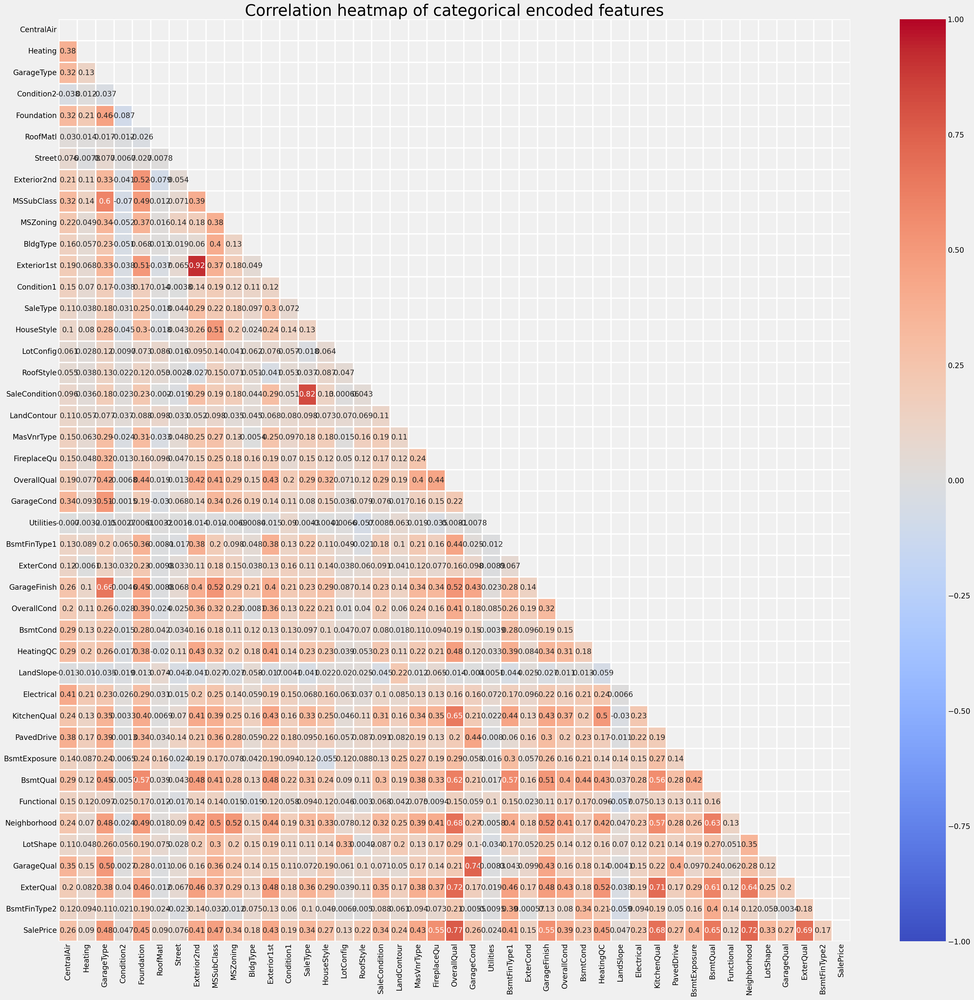

In [49]:
mask = np.zeros_like(X_train[categorical_var+target_var].corr())
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(30,30))
sns.heatmap(X_train[categorical_var+target_var].corr(),
            cmap='coolwarm',
            annot=True,
            mask=mask,
            linewidths=2.5,
            vmin=-1,
            vmax=1,
                
)
plt.title('Correlation heatmap of categorical encoded features', fontsize=30);

In [50]:
# We will export the newly encoded X_train and X_test dataframes to csv files to import if needed.
# _train.to_csv(r'C:\Users\dlbry\Downloads\DSC 680\Iowa Housing Project\X_train_cleaned.csv')
# _test.to_csv(r'C:\Users\dlbry\Downloads\DSC 680\Iowa Housing Project\X_test_cleaned.csv')

### Univariate Feature Selection
We are trying to predict the target variable SalePrice. We will now use an F-test to examine the individual relationship between each feature and the target variable. The F-test will show which variables are good predictors of the target variable individually. The test does not show which variables will be good predictors when combined together.

In [51]:
# Feature selection using F
# Import the f_regression function
from sklearn.feature_selection import f_regression

# We have already split the data into X_train and y_train, so we will use those as parameters
[f_stat, f_p_value] = f_regression(X_train.drop('SalePrice',axis=1), y_train)

In [52]:
# Create the df of results
f_test_df = pd.DataFrame({'Feature':X_train.drop('SalePrice',axis=1).columns,
                          'F statistic':f_stat,
                          'p value':f_p_value})

top_f_test_variables = f_test_df.sort_values('p value')[:25].Feature.unique()
print('The top 25 features sorted by p value:')
f_test_df.sort_values('p value')[:25]

The top 25 features sorted by p value:


,Feature,F statistic,p value
15,OverallQual,1909.422369,1.067943e-259
44,GrLivArea,1519.899208,1.341592e-222
10,Neighborhood,1466.138416,4.388561e-217
25,ExterQual,1235.157344,4.059980e-192
51,KitchenQual,1152.852829,1.125992e-182
59,GarageCars,1105.860938,3.840746e-177
60,GarageArea,1013.719183,5.625189e-166
28,BsmtQual,997.150628,6.373801e-164
36,TotalBsmtSF,971.495192,1.033580e-160
41,1stFlrSF,933.853754,6.156345e-156


From above, we can see that many of the variables from the Random Forest feature importance list also appear as good individual predictors. The top 3 variables ('OverallQual', 'GrLivArea', and 'Neighborhood') are exactly the same. This indicates that high quality, large houses in good neighborhoods would likely have the highest prices. 

## Model building with the PyCaret library
What is PyCaret?
[PyCaret](https://pycaret.org/) is an open source, low-code machine learning library in Python that allows you to quickly complete all the steps of the modeling process, including data preprocessing, feature engineering, and model tuning, plotting, and ensembling.  
We will be using PyCaret to do the following:  

    1. Create a baseline naive model (not using PyCaret) 
    2. Create and compare multiple models without feature scaling or target transformation
    3. Create and compare multiple models with both feature scaling and target transformation
    4. Evaluate model performance for the top model
    5. Predict on the test set using top model
    6. Create a blended model using top 3 models
    7. Create and save the final model 
    

### Create a baseline naive model
This model will predict the average price for every house. No variables are included in the model. From below, we can see that the Mean Root Square Error of the baseline model is almost $73,802. This is the number to beat.

In [53]:
data = X_train[['SalePrice']].copy()
data['baseline_guess'] = X_train['SalePrice'].mean()

baseline_MRSE = metrics.mean_squared_error(y_true=X_train['SalePrice'], y_pred=data['baseline_guess'])**.5
print(f'Baseline Mean Root Square Error in dollars: {round(baseline_MRSE,2)}.')

Baseline Mean Root Square Error in dollars: 73802.07.


### Create and compare multiple models without feature scaling or target transformation
Creating models in PyCaret is simple. You need only pass the dataframe and target variable as parameters inside the setup function. PyCaret also allows you to perform multiple operations on the data. First we will create models without feature scaling or transformation of the target variable.

In [54]:
from pycaret.regression import *
exp_reg_no_scaling = setup(data = X_train,
                   target = 'SalePrice',
                   numeric_features = list(X_train.drop('SalePrice',axis=1).columns),
                   transform_target=False,
                   normalize=False,
                   normalize_method='robust', #Ignored when normalize=False
                   test_data=X_test)

,Description,Value
0,session_id,2980
1,Target,SalePrice
2,Original Data,"(1337, 76)"
3,Missing Values,False
4,Numeric Features,75
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(1337, 75)"


In [55]:
import time
start = time.time()
best_models = compare_models(n_select = 5,
                             exclude = ['lar','par','llar','huber','lasso','en'],
                             fold=5)
end = time.time()
print(end - start)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,13208.6122,407233844.0466,19908.0699,0.9252,0.1073,0.0770,3.1920
gbr,Gradient Boosting Regressor,14591.8653,476330232.5290,21553.9715,0.9126,0.1166,0.0849,0.1500
lightgbm,Light Gradient Boosting Machine,14280.0063,488902021.0982,21875.3669,0.9103,0.1160,0.0828,0.0800
et,Extra Trees Regressor,14743.6004,502812636.8402,22258.1490,0.9077,0.1212,0.0865,0.2820
rf,Random Forest Regressor,15485.6533,563190992.2501,23498.7099,0.8967,0.1274,0.0911,0.3980
br,Bayesian Ridge,17429.6295,578135397.3033,23968.8851,0.8932,0.1453,0.1064,0.0120
xgboost,Extreme Gradient Boosting,15908.4920,598275635.2000,24165.1992,0.8903,0.1237,0.0896,0.3720
ridge,Ridge Regression,17758.6258,600349696.0000,24423.6391,0.8891,0.1502,0.1091,0.4400
lr,Linear Regression,17809.8777,604234086.4000,24500.6664,0.8884,0.1508,0.1094,0.6600
ada,AdaBoost Regressor,20321.1789,765487524.3908,27603.7506,0.8588,0.1664,0.1306,0.0920


36.34526562690735


### Create and compare multiple models with both feature scaling and target transformation  
Next, we will create models without both feature scaling and transformation of the target variable.

In [56]:
from pycaret.regression import *
exp_reg_with_scaling = setup(data = X_train,
                   target = 'SalePrice',
                   numeric_features = list(X_train.drop('SalePrice',axis=1).columns),
                   transform_target=True,
                   normalize=True,
                   normalize_method='robust',
                   test_data=X_test)

,Description,Value
0,session_id,1492
1,Target,SalePrice
2,Original Data,"(1337, 76)"
3,Missing Values,False
4,Numeric Features,75
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(1337, 75)"


In [57]:
import time
start = time.time()
best_models = compare_models(n_select = 5,
                             exclude = ['lar','par','llar','huber','lasso','en'],
                             fold=5)
end = time.time()
print(end - start)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,13197.5033,419367213.7831,20117.2234,0.9231,0.1072,0.0759,3.0660
br,Bayesian Ridge,14276.1883,430594280.8272,20716.7630,0.9205,0.1159,0.0842,0.0100
ridge,Ridge Regression,14511.4432,448494054.4000,21133.6301,0.9172,0.1175,0.0854,0.0100
lr,Linear Regression,14548.0119,451718342.4000,21206.0711,0.9166,0.1178,0.0856,0.0100
lightgbm,Light Gradient Boosting Machine,14385.2763,488756017.9795,21838.2298,0.9105,0.1171,0.0829,0.1000
gbr,Gradient Boosting Regressor,14573.0877,515108233.4828,22337.7221,0.9059,0.1170,0.0829,0.1280
et,Extra Trees Regressor,14869.8694,531407215.8674,22832.5041,0.9027,0.1202,0.0842,0.2520
xgboost,Extreme Gradient Boosting,15492.8205,550963942.4000,23300.4016,0.8988,0.1249,0.0890,0.2780
rf,Random Forest Regressor,15407.1111,594420440.7316,24096.7921,0.8913,0.1266,0.0882,0.3080
omp,Orthogonal Matching Pursuit,18121.3158,723489678.8187,26827.1491,0.8670,0.1423,0.1038,0.0080


27.641704320907593


From above, we can see that feature scaling and target transformation greatly increased model performance for Bayesian Ridge, Ridge, and Linear Regression. None of these three models were in the top 5 performing models when there was no feature scaling or target transformation, but all three jumped into the top 4 models when both feature scaling and target transformation occurred. The CatBoost Regressor remained the top performing model in both cases. 

### Evaluate model performance for the best model (CatBoost).  
This function displays a user interface for analyzing performance of a trained model.

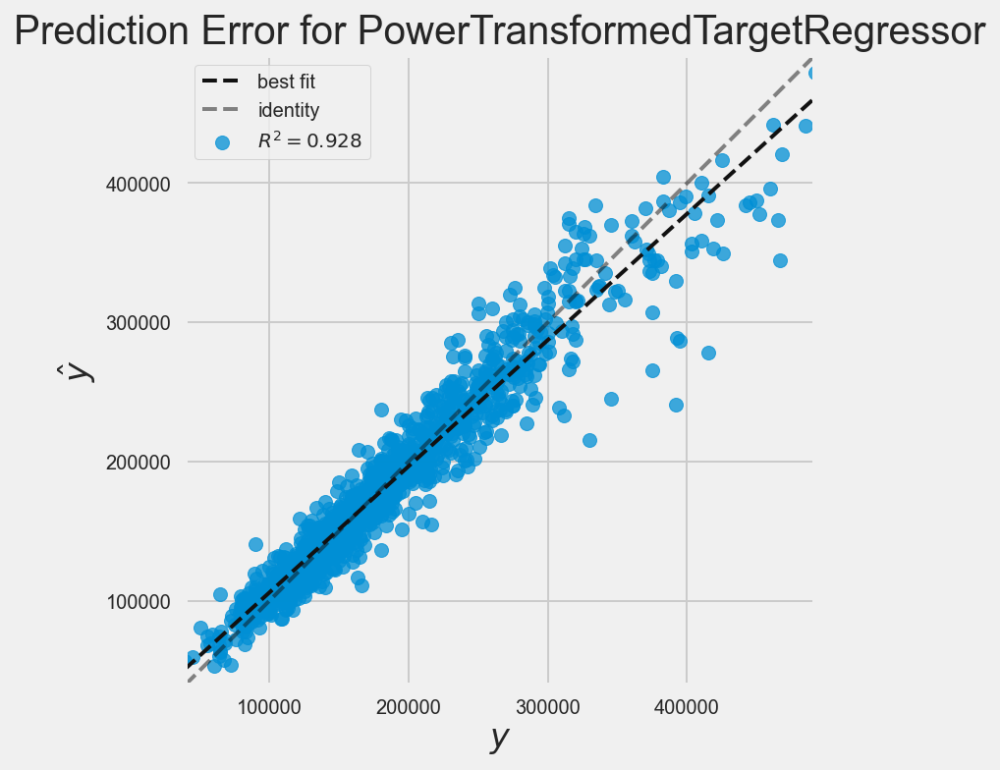

In [68]:
plt.style.use('fivethirtyeight')
plot_model(best_models[0], plot = 'error')

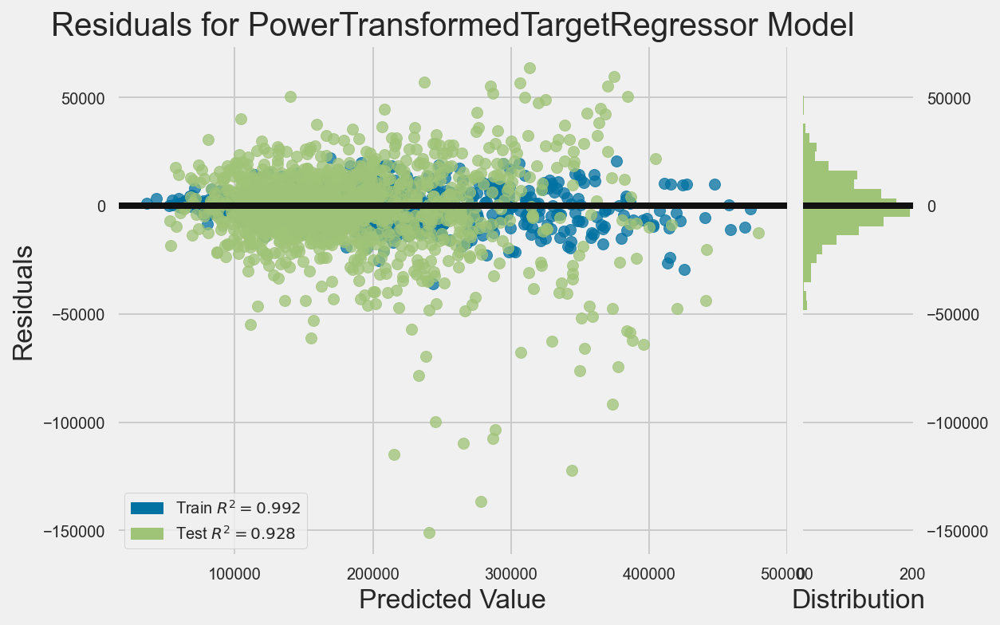

In [72]:
plt.style.use('fivethirtyeight')
plot_model(best_models[0], plot = 'residuals')

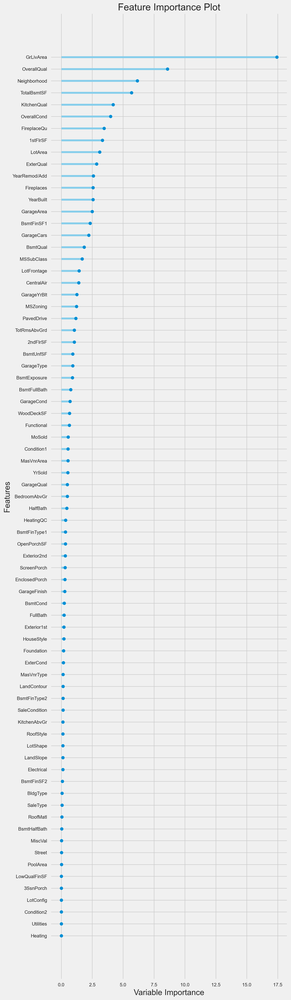

In [67]:
plot_model(best_models[0], plot='feature_all')

### Predict on the test set using the best model (CatBoost).  
This function returns the metrics from predictions on the test set. The X_test dataframe is also returned, with a Label column added that labels the predictions for each record. 

In [60]:
predict_model(best_models[0])

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,CatBoost Regressor,12857.4082,381589366.8852,19534.3126,0.9278,0.0965,0.0704


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Label
0,0.0,0.0,-0.263158,-0.244267,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.25,-1.0,-1.0,0.0,116000.0,116233.541915
1,0.0,0.0,0.947368,0.614656,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.25,1.0,0.0,0.0,220000.0,224878.076982
2,0.0,0.0,0.684211,0.246760,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.75,1.0,0.0,0.0,186000.0,161742.015943
3,0.0,0.0,0.789474,0.274925,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,280.0,0.0,0.0,0.50,-1.0,0.0,0.0,157500.0,146511.150926
4,-0.2,0.0,0.526316,-0.356431,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.25,0.5,0.0,0.0,138000.0,128575.596853
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1328,0.0,0.0,0.578947,-0.447408,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,1.0,0.0,0.0,148000.0,142983.092349
1329,0.4,0.0,-0.263158,-0.317049,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.25,0.0,0.0,0.0,224900.0,211799.465697
1330,-1.8,0.0,-0.526316,0.341476,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.25,0.5,0.0,0.0,78500.0,91347.378076
1331,-1.8,-1.0,-0.526316,0.088734,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.25,-1.0,0.0,0.0,91000.0,86512.732525


### Create a blended model using the top 3 models
Blending is a common technique for ensembling that can be used in PyCaret. It creates multiple models and then averages the individual predictions to form a final prediction. We will blend the top 3 models, which are the first 3 indexes of the best_models list that we created.

In [61]:
# Train individual models to blend
import time
start = time.time()
blend_hard = blend_models(estimator_list = best_models[:3])
end = time.time()
print(end - start)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,13477.0960,312995839.4832,17691.6884,0.9262,0.0972,0.0763
1,14072.5477,425441131.8739,20626.2244,0.9394,0.1092,0.0783
2,11116.7023,227688015.8575,15089.3345,0.9502,0.0995,0.0705
3,14139.8689,385192997.4939,19626.3343,0.9304,0.1337,0.0927
4,13082.6764,397199600.4214,19929.8670,0.9267,0.1137,0.0783
5,14728.6113,689515537.5537,26258.6279,0.8763,0.1199,0.0807
6,11785.4486,325856512.2716,18051.4961,0.9535,0.0750,0.0581
7,13378.7666,374345342.9445,19348.0062,0.9205,0.1077,0.0785
8,13156.1487,348538098.9630,18669.1751,0.9237,0.1149,0.0832
9,12688.4915,313121253.0998,17695.2325,0.9408,0.1042,0.0780


37.943201541900635


In [62]:
predict_model(blend_hard)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Voting Regressor,12942.3326,377580643.0537,19431.4344,0.9285,0.0988,0.0720


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,Label
0,0.0,0.0,-0.263158,-0.244267,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.25,-1.0,-1.0,0.0,116000.0,113367.649363
1,0.0,0.0,0.947368,0.614656,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.25,1.0,0.0,0.0,220000.0,216641.237103
2,0.0,0.0,0.684211,0.246760,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.75,1.0,0.0,0.0,186000.0,155614.689105
3,0.0,0.0,0.789474,0.274925,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,280.0,0.0,0.0,0.50,-1.0,0.0,0.0,157500.0,149004.894935
4,-0.2,0.0,0.526316,-0.356431,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.25,0.5,0.0,0.0,138000.0,129797.098306
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1328,0.0,0.0,0.578947,-0.447408,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.00,1.0,0.0,0.0,148000.0,139041.833921
1329,0.4,0.0,-0.263158,-0.317049,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.25,0.0,0.0,0.0,224900.0,212014.537542
1330,-1.8,0.0,-0.526316,0.341476,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.25,0.5,0.0,0.0,78500.0,105606.531979
1331,-1.8,-1.0,-0.526316,0.088734,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,-0.25,-1.0,0.0,0.0,91000.0,87257.331593


We can see that the blended model performs very slightly better than the CatBoost model on the test data.

### Finalize and save model  
We will select the catboost model and create a final model.

In [63]:
final_catboost = finalize_model(best_models[0])

In [64]:
save_model(final_catboost, 'final_catboost_model')

Transformation Pipeline and Model Succesfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=['MSSubClass',
                                                           'MSZoning',
                                                           'LotFrontage',
                                                           'LotArea', 'Street',
                                                           'LotShape',
                                                           'LandContour',
                                                           'Utilities',
                                                           'LotConfig',
                                                           'LandSlope',
                                                           'Neighbor

## Conclusions
I am pleased with the performance of the models. The best model had an RMSE of 19,534 on the test set, which was a huge improvement over the baseline naive model RMSE of 73,802. The results also showed that the 10 most important features for determining the price of the home are 'GrLivArea', 'OverallQual', 'Neighborhood', '1stFlrSF', 'TotalBsmtSF','ExterQual', OverallCond', 'GarageArea', 'FireplaceQu', and 'LotArea'. Looking further down the list, feature 'KitchenQual' = #11, 'YearBuilt' = # 13, 'YearRemod/Add' = #15. The model informs buyers, sellers and realtors that house size, quality, and location are very good predictors of house price. Additionally, if homeowners want to increase the value of their house, a good way to do it would be to remodel the kitchen. While this model is based on home prices in Iowa, I believe that it could be modified to add features that are more common in warmer climates (for example a pool or water features).